In [1]:
import sys
sys.path.append('..')
%load_ext autoreload
%autoreload 2
import numpy as np
import pathlib
import matplotlib.pyplot as plt
from soilgasflux_fcs import json_reader, models, metrics
import xarray as xr



/Users/alexnaokiasatokobayashi/opt/anaconda3/envs/Peat/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [128]:
ds = xr.open_dataset('./output/synthetic_test05_2025-05-08.nc')
dsMC = xr.open_dataset('./output/synthetic_test05_mc_NormLen_2025-05-08.nc')
expected_ds = xr.open_dataset('./output/expected_synthetic_test06_2025-05-08.nc')
ds

<xarray.Dataset> Size: 216kB
Dimensions:        (time: 30, cutoff: 15, deadband: 6)
Coordinates:
  * time           (time) datetime64[ns] 240B 2025-05-08T15:22:56 ... 2025-05...
  * deadband       (deadband) int32 24B 0 10 20 30 40 50
  * cutoff         (cutoff) int32 60B 30 40 50 60 70 80 ... 130 140 150 160 170
Data variables:
    dcdt(HM)       (time, cutoff, deadband) float64 22kB ...
    dcdt(linear)   (time, cutoff, deadband) float64 22kB ...
    AIC(HM)        (time, cutoff, deadband) float64 22kB ...
    AIC(linear)    (time, cutoff, deadband) float64 22kB ...
    RMSE(HM)       (time, cutoff, deadband) float64 22kB ...
    RMSE(linear)   (time, cutoff, deadband) float64 22kB ...
    R2(HM)         (time, cutoff, deadband) float64 22kB ...
    R2(linear)     (time, cutoff, deadband) float64 22kB ...
    nRMSE(HM)      (time, cutoff, deadband) float64 22kB ...
    nRMSE(linear)  (time, cutoff, deadband) float64 22kB ...

In [129]:
dsMC

<xarray.Dataset> Size: 119MB
Dimensions:        (time: 30, cutoff: 15, deadband: 6, MC: 1000)
Coordinates:
  * time           (time) datetime64[ns] 240B 2025-05-08T15:22:56 ... 2025-05...
  * deadband       (deadband) int32 24B 0 10 20 30 40 50
  * cutoff         (cutoff) int32 60B 30 40 50 60 70 80 ... 130 140 150 160 170
  * MC             (MC) int32 4kB 0 1 2 3 4 5 6 ... 993 994 995 996 997 998 999
Data variables:
    dcdt(HM)       (time, cutoff, deadband, MC) float32 11MB ...
    dcdt(linear)   (time, cutoff, deadband, MC) float32 11MB ...
    AIC(HM)        (time, cutoff, deadband, MC) float32 11MB ...
    AIC(linear)    (time, cutoff, deadband, MC) float32 11MB ...
    RMSE(HM)       (time, cutoff, deadband, MC) float32 11MB ...
    RMSE(linear)   (time, cutoff, deadband, MC) float32 11MB ...
    R2(HM)         (time, cutoff, deadband, MC) float32 11MB ...
    R2(linear)     (time, cutoff, deadband, MC) float32 11MB ...
    nRMSE(HM)      (time, cutoff, deadband, MC) float32 11MB ...
    nRMSE(linear)  (time, cutoff, deadband, MC) float32 11MB ...
    logprob(HM)    (time, cutoff, deadband, MC) float32 11MB ...

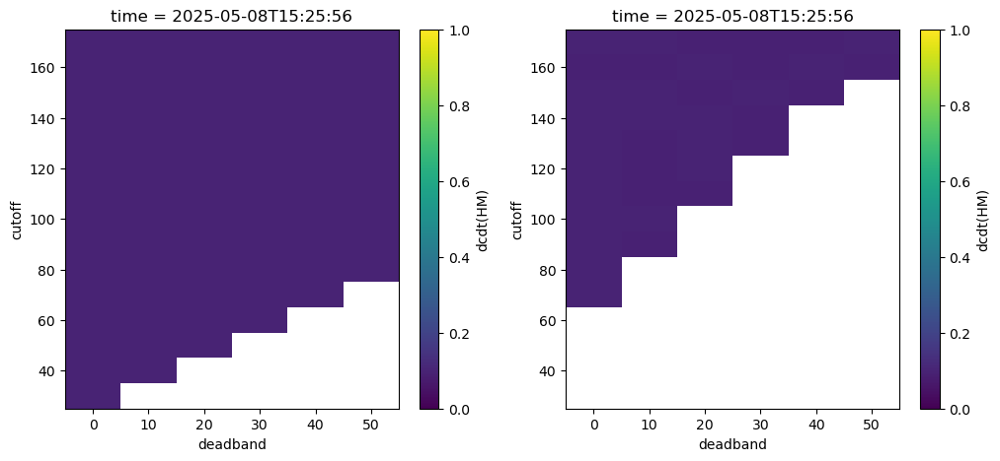

In [130]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ds.isel(time=1)['dcdt(HM)'].plot(vmin=0, vmax=1, ax=ax[0])
dsMC.isel(time=1)['dcdt(HM)'].median(dim='MC').plot(vmin=0, vmax=1, ax=ax[1])

(array([ 17.,  42.,  97., 193., 226., 200., 149.,  54.,  17.,   5.]),
 array([1.14395905, 1.1452955 , 1.14663208, 1.14796853, 1.14930499,
        1.15064144, 1.15197802, 1.15331447, 1.15465093, 1.1559875 ,
        1.15732396]),
 <BarContainer object of 10 artists>)

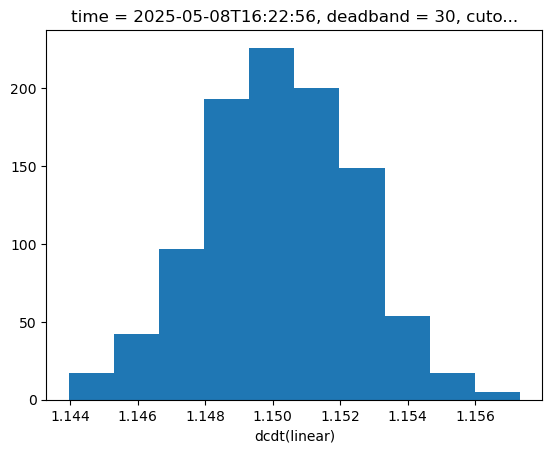

In [131]:
dsMC.isel(time=20, cutoff=5, deadband=3)['dcdt(linear)'].plot.hist()

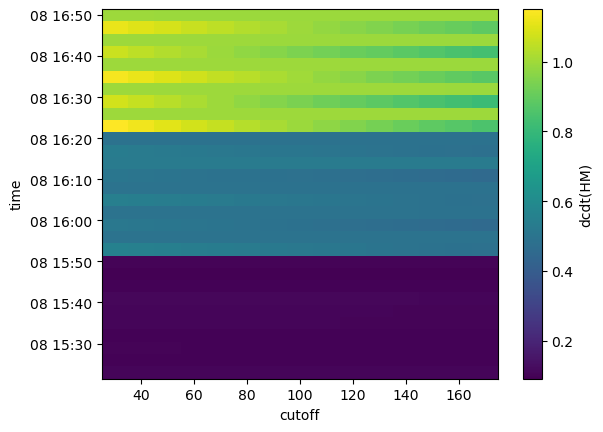

In [132]:
expected_ds['dcdt(HM)'].plot()

In [133]:
expected_ds

<xarray.Dataset> Size: 8kB
Dimensions:       (time: 30, cutoff: 15)
Coordinates:
  * time          (time) datetime64[ns] 240B 2025-05-08T15:22:56 ... 2025-05-...
  * cutoff        (cutoff) int32 60B 30 40 50 60 70 80 ... 130 140 150 160 170
Data variables: (12/14)
    dcdt(HM)      (time, cutoff) float64 4kB ...
    deadband      (time) int64 240B ...
    d_intensity   (time) int64 240B ...
    d_startpoint  (time) int64 240B ...
    add_noise     (time) bool 30B ...
    c0            (time) int64 240B ...
    ...            ...
    pressure      (time) float64 240B ...
    temperature   (time) float64 240B ...
    humidity      (time) float64 240B ...
    area          (time) float64 240B ...
    volume        (time) float64 240B ...
    curvature     (time) <U8 960B ...

In [134]:
from scipy.stats import binned_statistic

In [135]:
test_a = expected_ds.isel(cutoff=0)['dcdt(HM)'].values
binned_statistic(test_a, test_a, bins=3)[2]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3])

In [136]:
# Define your intensity categories
intensity_labels = ['low', 'medium', 'high']

# Calculate bin indices (0, 1, or 2)
bin_indices = binned_statistic(test_a, test_a, bins=3)[2] - 1  # -1 because bins are 1-indexed

# Map indices to labels
intensity_categories = np.array(intensity_labels)[bin_indices]
group_intensity = xr.DataArray(
    intensity_categories,
    coords={'time': expected_ds['time']},
    dims=['time']
)

expected_ds = expected_ds.assign_coords(intensity_categories=group_intensity)

In [137]:
expected_ds

<xarray.Dataset> Size: 8kB
Dimensions:               (time: 30, cutoff: 15)
Coordinates:
  * time                  (time) datetime64[ns] 240B 2025-05-08T15:22:56 ... ...
  * cutoff                (cutoff) int32 60B 30 40 50 60 70 ... 140 150 160 170
    intensity_categories  (time) <U6 720B 'low' 'low' 'low' ... 'high' 'high'
Data variables: (12/14)
    dcdt(HM)              (time, cutoff) float64 4kB ...
    deadband              (time) int64 240B ...
    d_intensity           (time) int64 240B ...
    d_startpoint          (time) int64 240B ...
    add_noise             (time) bool 30B ...
    c0                    (time) int64 240B ...
    ...                    ...
    pressure              (time) float64 240B ...
    temperature           (time) float64 240B ...
    humidity              (time) float64 240B ...
    area                  (time) float64 240B ...
    volume                (time) float64 240B ...
    curvature             (time) <U8 960B ...

In [138]:
expected_ds['temperature'].values

array([20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20.,
       20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20., 20.,
       20., 20., 20., 20.])

In [139]:
expected_ds['mdf'] = metrics.minimum_detectable_flux(Aa=30*1000, 
                                                     tc=expected_ds['cutoff'],
                                                     freq=1, 
                                                     V=expected_ds['volume']/10e6,
                                                     A=expected_ds['area']/10e4, 
                                                     P=expected_ds['pressure'], 
                                                     T=expected_ds['temperature']+273.15)

In [140]:
expected_ds['w0'] = models.mole_fraction_water_vapor(temperature=expected_ds['temperature']+273.15,
                                                     pressure=expected_ds['pressure'],
                                                     humidity=expected_ds['humidity'])

In [141]:
expected_ds['w0']

<xarray.DataArray 'w0' (time: 30)> Size: 240B
array([46.52837829, 46.52837829, 46.52837829, 46.52837829, 46.52837829,
       46.52837829, 46.52837829, 46.52837829, 46.52837829, 46.52837829,
       46.52837829, 46.52837829, 46.52837829, 46.52837829, 46.52837829,
       46.52837829, 46.52837829, 46.52837829, 46.52837829, 46.52837829,
       46.52837829, 46.52837829, 46.52837829, 46.52837829, 46.52837829,
       46.52837829, 46.52837829, 46.52837829, 46.52837829, 46.52837829])
Coordinates:
  * time                  (time) datetime64[ns] 240B 2025-05-08T15:22:56 ... ...
    intensity_categories  (time) <U6 720B 'low' 'low' 'low' ... 'high' 'high'

In [142]:
expected_ds['mdf_dcdt'] = models.soilgasflux_to_dcdt(volume=expected_ds['volume'],
                           area=expected_ds['area'],
                           p0=expected_ds['pressure']/1000,
                           w0=expected_ds['w0'],
                           t0=expected_ds['temperature'],
                           soilgasflux=expected_ds['mdf']/10e3
                        # soilgasflux=1,
                           )

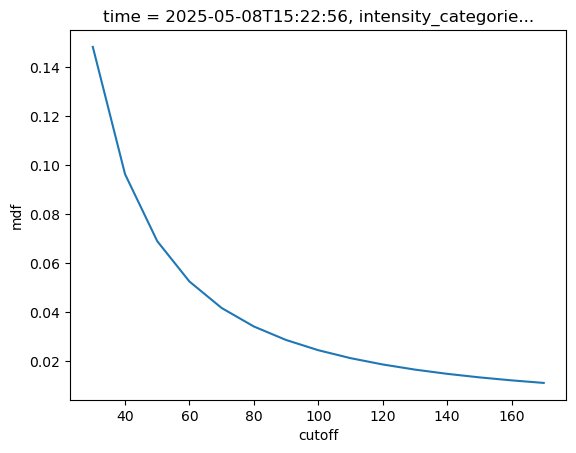

In [143]:
(expected_ds['mdf']/10e3).isel(time=0).plot()

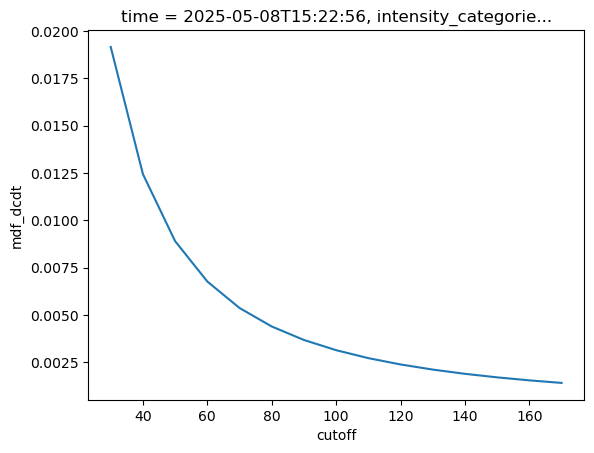

In [144]:
expected_ds['mdf_dcdt'].isel(time=0).plot()

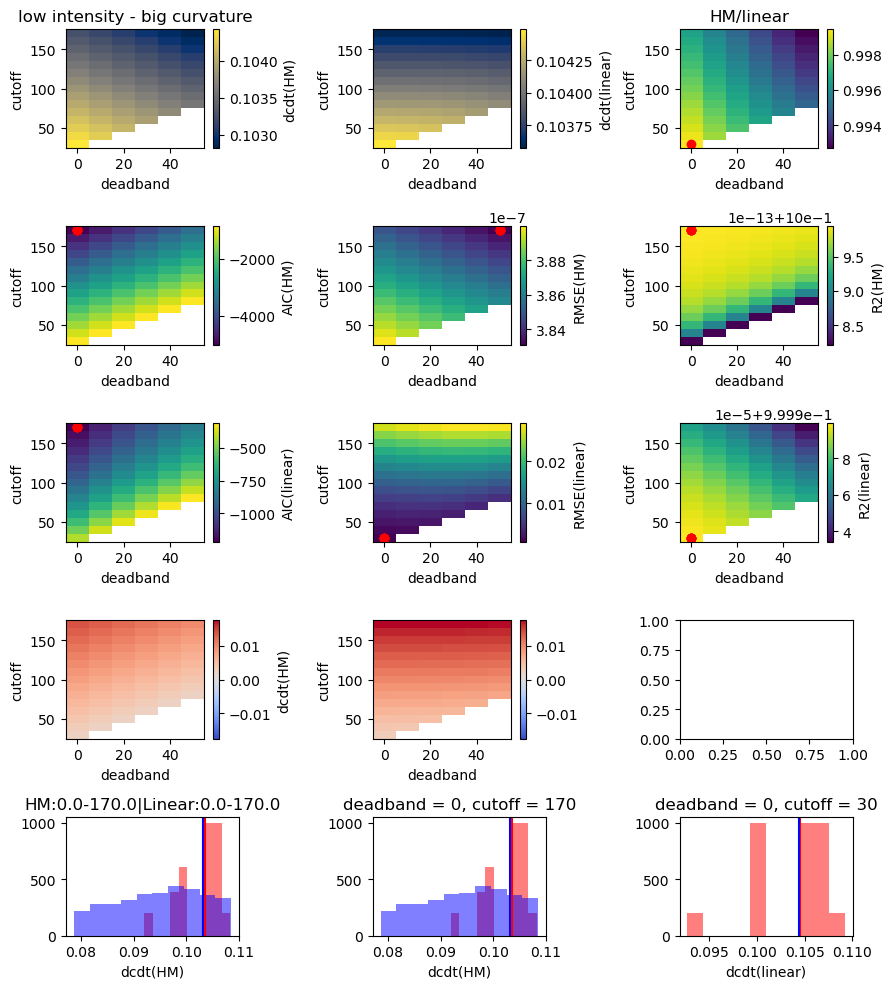

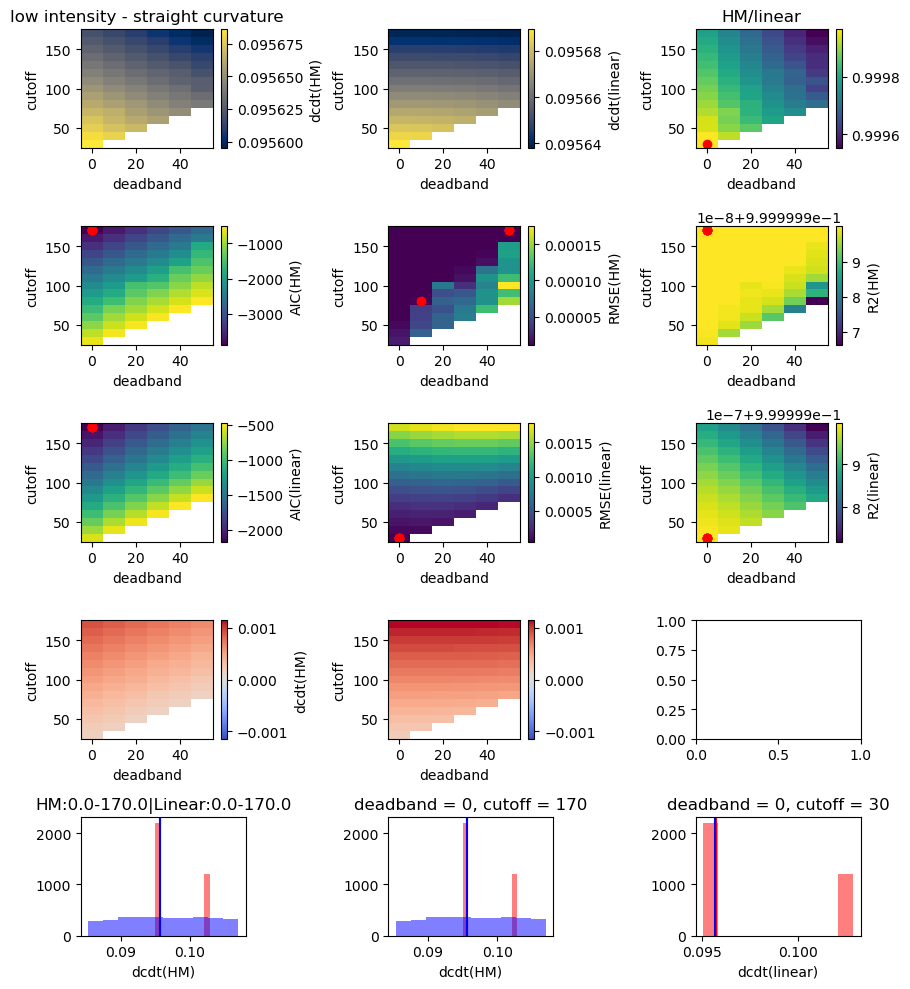

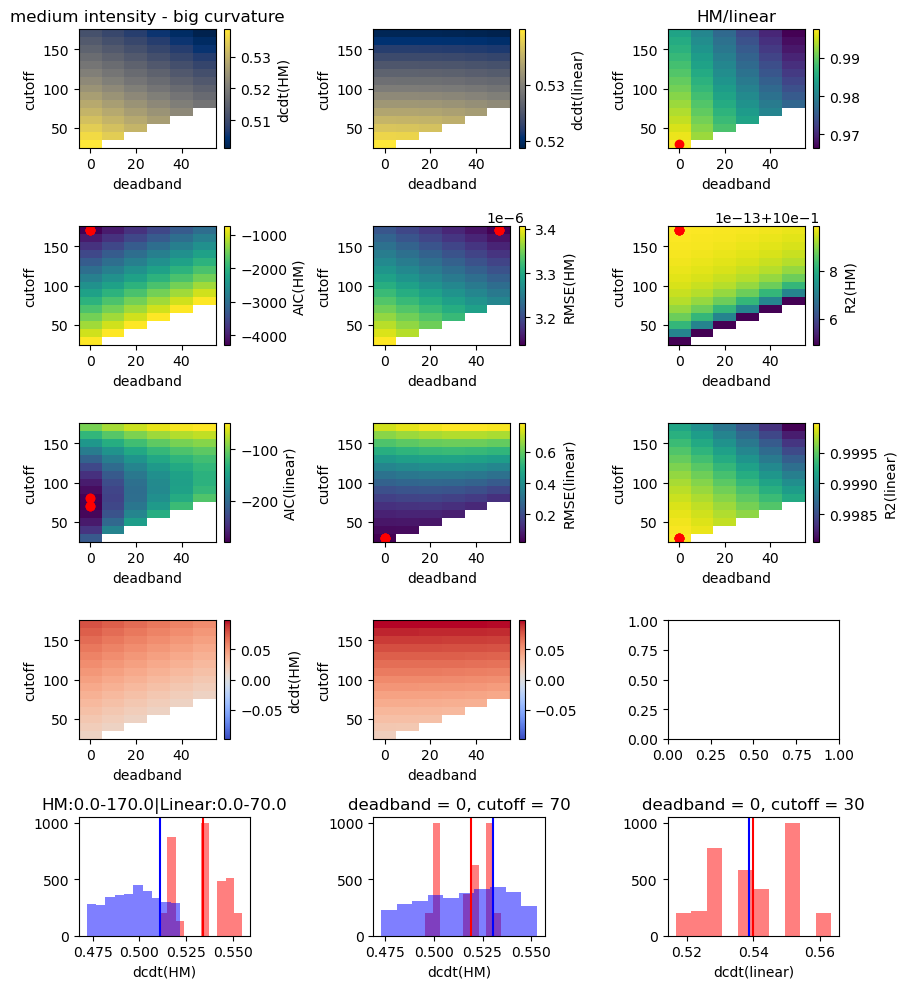

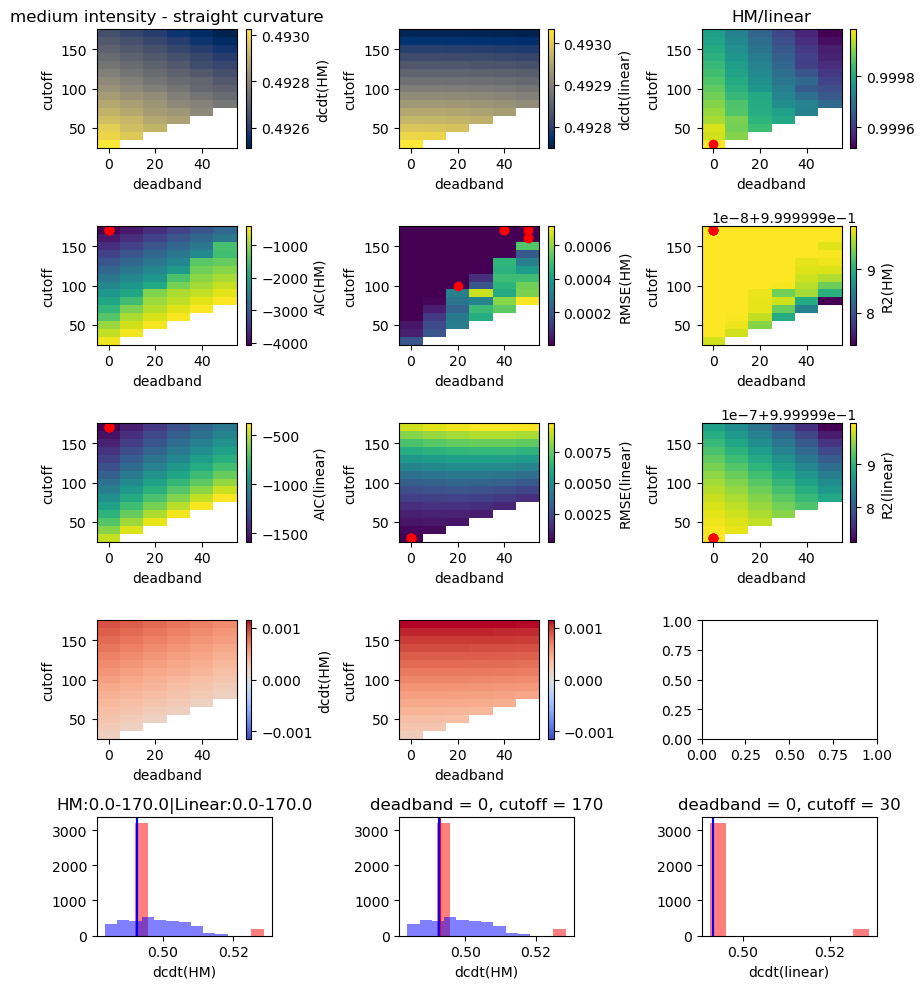

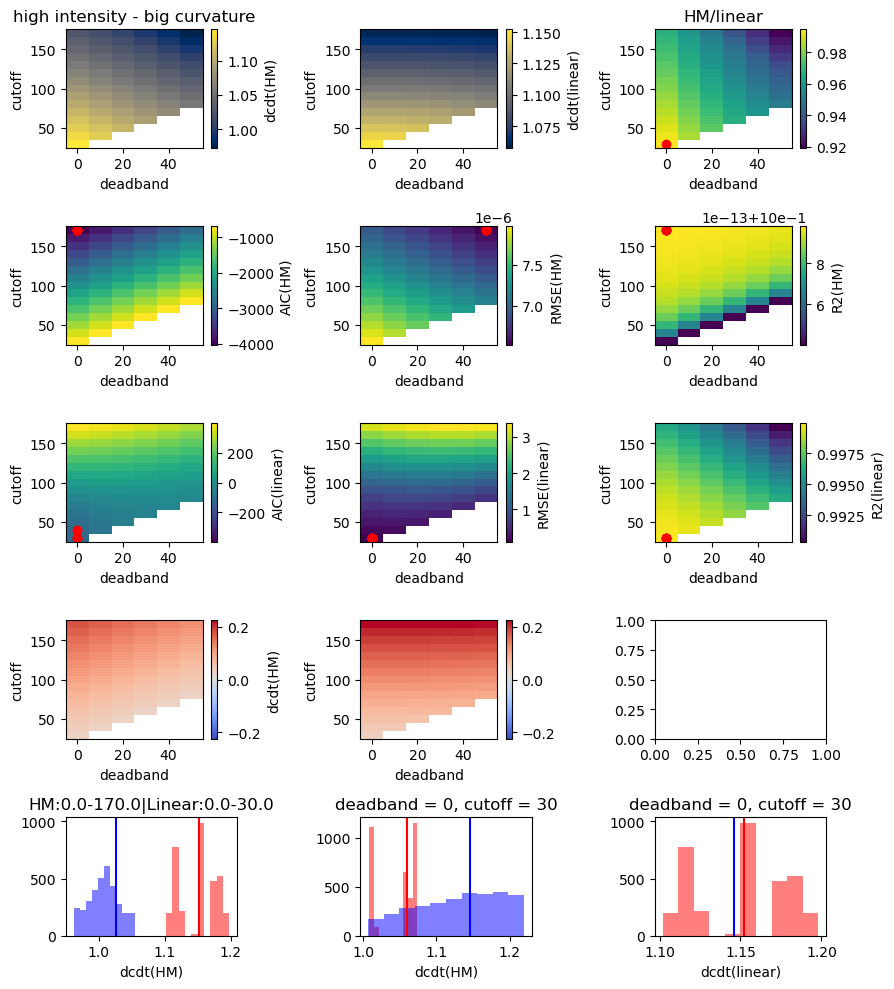

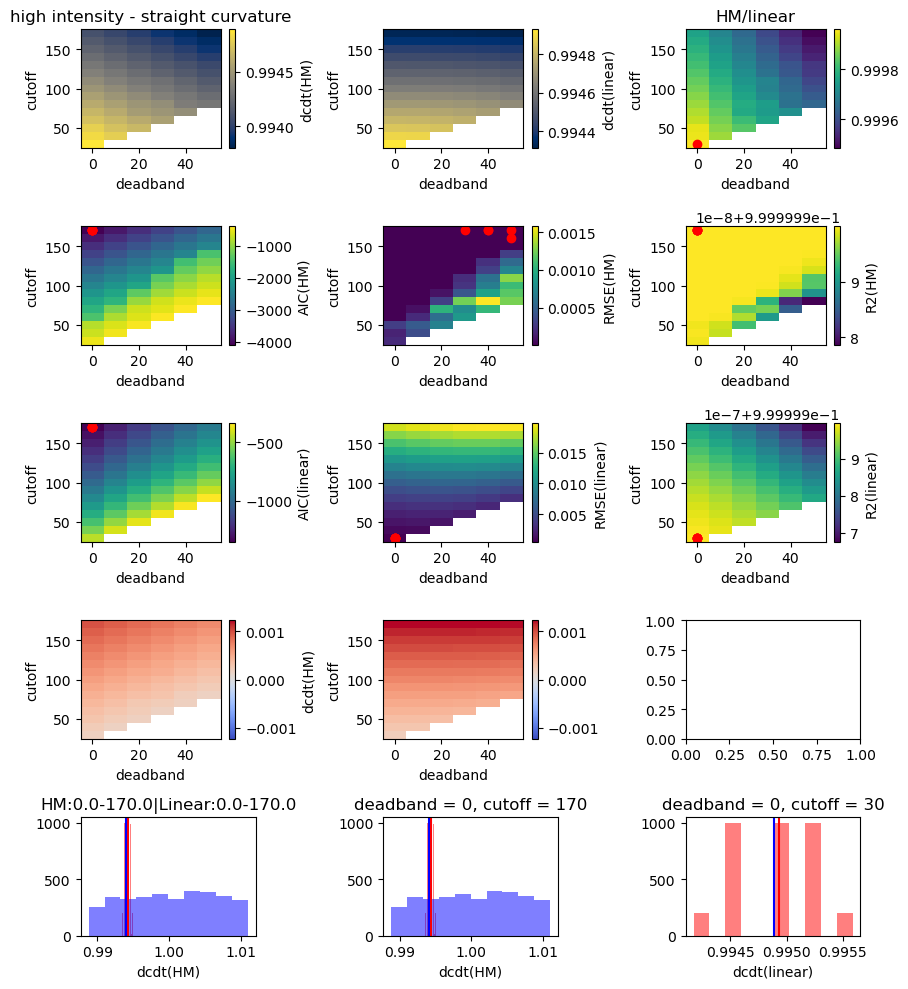

In [145]:
# for intensity in np.unique(expected_ds['intensity_categories'].values):
for intensity in ['low', 'medium', 'high']:
    # print(intensity)
    time_intensity = expected_ds.where(expected_ds['intensity_categories'] == intensity, drop=True)
    cutoff_coords, deadband_coords = ds.coords['cutoff'], ds.coords['deadband']
    for curve in np.unique(time_intensity['curvature'].values):
        # print(curve)
        time_selection = expected_ds.where((expected_ds['intensity_categories'] == intensity) & (expected_ds['curvature'] == curve), drop=True).time.values
        # print(time_selection)
        # print()
        fig, ax = plt.subplots(5, 3, figsize=(9, 10))
        ds.sel(time=time_selection)['dcdt(HM)'].median(dim='time').plot(ax=ax[0,0], cmap='cividis')
        ds.sel(time=time_selection)['dcdt(linear)'].median(dim='time').plot(ax=ax[0,1], cmap='cividis')

        gfactor = (ds.sel(time=time_selection)['dcdt(HM)'].median(dim='time')/ds.sel(time=time_selection)['dcdt(linear)'].median(dim='time'))
        gfactor.plot(ax=ax[0,2], cmap='viridis')

        ds.sel(time=time_selection)['AIC(HM)'].median(dim='time').plot(ax=ax[1,0], cmap='viridis')
        ds.sel(time=time_selection)['RMSE(HM)'].median(dim='time').plot(ax=ax[1,1], cmap='viridis')
        ds.sel(time=time_selection)['R2(HM)'].median(dim='time').plot(ax=ax[1,2], cmap='viridis')

        ds.sel(time=time_selection)['AIC(linear)'].median(dim='time').plot(ax=ax[2,0], cmap='viridis')
        ds.sel(time=time_selection)['RMSE(linear)'].median(dim='time').plot(ax=ax[2,1], cmap='viridis')
        ds.sel(time=time_selection)['R2(linear)'].median(dim='time').plot(ax=ax[2,2], cmap='viridis')


        aic_argmin_HM = ds.sel(time=time_selection)['AIC(HM)'].argmin(dim=['cutoff', 'deadband'])
        aic_argmin_linear = ds.sel(time=time_selection)['AIC(linear)'].argmin(dim=['cutoff', 'deadband'])

        rmse_argmin_HM = ds.sel(time=time_selection)['RMSE(HM)'].argmin(dim=['cutoff', 'deadband'])
        rmse_argmin_linear = ds.sel(time=time_selection)['RMSE(linear)'].argmin(dim=['cutoff', 'deadband'])

        r2_argmax_HM = ds.sel(time=time_selection)['R2(HM)'].argmax(dim=['cutoff', 'deadband'])
        r2_argmax_linear = ds.sel(time=time_selection)['R2(linear)'].argmax(dim=['cutoff', 'deadband'])

        closeness_to1_argmin = abs(gfactor-1).argmin(dim=['cutoff', 'deadband'])
        # print(abs(gfactor)-1)

        ax[0,2].scatter(deadband_coords[closeness_to1_argmin['deadband']],
                        cutoff_coords[closeness_to1_argmin['cutoff']], color='red')

        ax[1,0].scatter(deadband_coords[aic_argmin_HM['deadband']], 
                        cutoff_coords[aic_argmin_HM['cutoff']], color='red')
        ax[2,0].scatter(deadband_coords[aic_argmin_linear['deadband']],
                        cutoff_coords[aic_argmin_linear['cutoff']], color='red')
        
        ax[1,1].scatter(deadband_coords[rmse_argmin_HM['deadband']],
                        cutoff_coords[rmse_argmin_HM['cutoff']], color='red')
        ax[2,1].scatter(deadband_coords[rmse_argmin_linear['deadband']],
                        cutoff_coords[rmse_argmin_linear['cutoff']], color='red')
        
        ax[1,2].scatter(deadband_coords[r2_argmax_HM['deadband']],
                        cutoff_coords[r2_argmax_HM['cutoff']], color='red')
        ax[2,2].scatter(deadband_coords[r2_argmax_linear['deadband']],
                        cutoff_coords[r2_argmax_linear['cutoff']], color='red')


        diff_hm = (((ds.sel(time=time_selection)['dcdt(HM)'] - expected_ds.sel(time=time_selection)['dcdt(HM)'])/expected_ds.sel(time=time_selection)['dcdt(HM)']).median(dim='time'))
        diff_linear = (((ds.sel(time=time_selection)['dcdt(linear)'] - expected_ds.sel(time=time_selection)['dcdt(HM)'])/expected_ds.sel(time=time_selection)['dcdt(HM)']).median(dim='time'))

        min_diff = min(diff_hm.min(), diff_linear.min())
        max_diff = max(diff_hm.max(), diff_linear.max())
        maximum_diff = max(abs(min_diff), abs(max_diff))

        diff_hm.plot(ax=ax[3,0], cmap='coolwarm', vmin=-maximum_diff, vmax=maximum_diff)
        diff_linear.plot(ax=ax[3,1], cmap='coolwarm', vmin=-maximum_diff, vmax=maximum_diff)

        print()

        mc_linear = dsMC.sel(time=time_selection, 
                             deadband=deadband_coords[aic_argmin_linear['deadband']].median(),
                             cutoff=cutoff_coords[aic_argmin_linear['cutoff']].median())['dcdt(linear)']
        mc_hm = dsMC.sel(time=time_selection,
                         deadband=deadband_coords[aic_argmin_HM['deadband']].median(),
                         cutoff=cutoff_coords[aic_argmin_HM['cutoff']].median())['dcdt(HM)']

        mc_linear2 = dsMC.sel(time=time_selection,
                              deadband=deadband_coords[aic_argmin_HM['deadband']].median(),
                                cutoff=cutoff_coords[aic_argmin_HM['cutoff']].median())['dcdt(linear)']
        mc_hm2 = dsMC.sel(time=time_selection,
                            deadband=deadband_coords[aic_argmin_linear['deadband']].median(),
                            cutoff=cutoff_coords[aic_argmin_linear['cutoff']].median())['dcdt(HM)']

        q_linear = mc_linear.quantile([0.16, 0.84])
        q_hm = mc_hm.quantile([0.16, 0.84])

        mc_linear = mc_linear.where((mc_linear > q_linear[0]) & (mc_linear < q_linear[1]), drop=True)
        mc_hm = mc_hm.where((mc_hm > q_hm[0]) & (mc_hm < q_hm[1]), drop=True)

        mc_linear.plot.hist(
                    # bins=np.linspace(dcdt_min, dcdt_max, 20),
                    ax=ax[4,0], alpha=0.5, color='red')

        ax[4,0].axvline(x=ds.sel(time=time_selection, 
                                 deadband=deadband_coords[aic_argmin_linear['deadband']].median(),
                                 cutoff=cutoff_coords[aic_argmin_linear['cutoff']].median())['dcdt(linear)'].median(), color='red')
        ax[4,0].axvline(x=ds.sel(time=time_selection,
                                 deadband=deadband_coords[aic_argmin_HM['deadband']].median(),
                                 cutoff=cutoff_coords[aic_argmin_HM['cutoff']].median())['dcdt(HM)'].median().values, color='blue')

        mc_hm.plot.hist(
                    # bins=np.linspace(dcdt_min, dcdt_max, 20),
                    ax=ax[4,0], alpha=0.5, color='blue')

        q_linear2 = mc_linear2.quantile([0.16, 0.84])
        q_hm2 = mc_hm2.quantile([0.16, 0.84])
        mc_linear2 = mc_linear2.where((mc_linear2 > q_linear2[0]) & (mc_linear2 < q_linear2[1]), drop=True)
        mc_hm2 = mc_hm2.where((mc_hm2 > q_hm2[0]) & (mc_hm2 < q_hm2[1]), drop=True)

        mc_linear2.plot.hist(
                    # bins=np.linspace(dcdt_min, dcdt_max, 20),
                    ax=ax[4,1], alpha=0.5, color='red')
        ax[4,1].axvline(x=ds.sel(time=time_selection,
                                 deadband=deadband_coords[aic_argmin_HM['deadband']].median(),
                                 cutoff=cutoff_coords[aic_argmin_HM['cutoff']].median())['dcdt(linear)'].median().values, color='red')
        ax[4,1].axvline(x=ds.sel(time=time_selection, 
                                 deadband=deadband_coords[aic_argmin_linear['deadband']].median(),
                                 cutoff=cutoff_coords[aic_argmin_linear['cutoff']].median())['dcdt(HM)'].median().values, color='blue')
        mc_hm2.plot.hist(
                    # bins=np.linspace(dcdt_min, dcdt_max, 20),
                    ax=ax[4,1], alpha=0.5, color='blue')

        mc_hm_gfactor = dsMC.sel(time=time_selection,
                                 deadband=deadband_coords[closeness_to1_argmin['deadband']].median(),
                                 cutoff=cutoff_coords[closeness_to1_argmin['cutoff']].median())['dcdt(HM)']
        mc_linear_gfactor = dsMC.sel(time=time_selection,
                                        deadband=deadband_coords[closeness_to1_argmin['deadband']].median(),
                                        cutoff=cutoff_coords[closeness_to1_argmin['cutoff']].median())['dcdt(linear)']
        q_linear_gfactor = mc_linear_gfactor.quantile([0.16, 0.84])
        q_hm_gfactor = mc_hm_gfactor.quantile([0.16, 0.84])
        mc_linear_gfactor = mc_linear_gfactor.where((mc_linear_gfactor > q_linear_gfactor[0]) & (mc_linear_gfactor < q_linear_gfactor[1]), drop=True)
        mc_hm_gfactor = mc_hm_gfactor.where((mc_hm_gfactor > q_hm_gfactor[0]) & (mc_hm_gfactor < q_hm_gfactor[1]), drop=True)
        mc_linear_gfactor.plot.hist(
                    # bins=np.linspace(dcdt_min, dcdt_max, 20),
                    ax=ax[4,2], alpha=0.5, color='red')
        ax[4,2].axvline(x=ds.sel(time=time_selection,
                                 deadband=deadband_coords[closeness_to1_argmin['deadband']].median(),
                                 cutoff=cutoff_coords[closeness_to1_argmin['cutoff']].median())['dcdt(linear)'].median().values, color='red')
        ax[4,2].axvline(x=ds.sel(time=time_selection,
                                 deadband=deadband_coords[closeness_to1_argmin['deadband']].median(),
                                 cutoff=cutoff_coords[closeness_to1_argmin['cutoff']].median())['dcdt(HM)'].median().values, color='blue')
        # mc_hm_gfactor.plot.hist(
        #             # bins=np.linspace(dcdt_min, dcdt_max, 20),
        #             ax=ax[4,2], alpha=0.5, color='blue')


        ax[0,0].set_title(f'{intensity} intensity - {curve} curvature')
        ax[0,2].set_title('HM/linear')
        ax[4,0].set_title(f"HM:{deadband_coords[aic_argmin_HM['deadband']].median().values}-{cutoff_coords[aic_argmin_HM['cutoff']].median().values}|Linear:{deadband_coords[aic_argmin_linear['deadband']].median().values}-{cutoff_coords[aic_argmin_linear['cutoff']].median().values}")

        fig.tight_layout()
        fig.show()
    
    # break

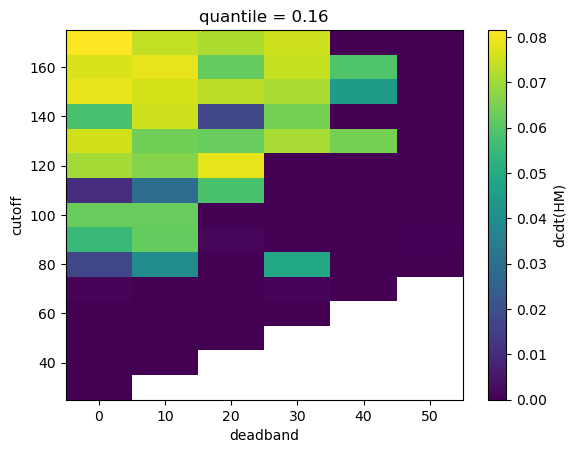

In [146]:
dsMC.isel(time=slice(0,3)).quantile(0.16,dim=['MC','time'])['dcdt(HM)'].plot()

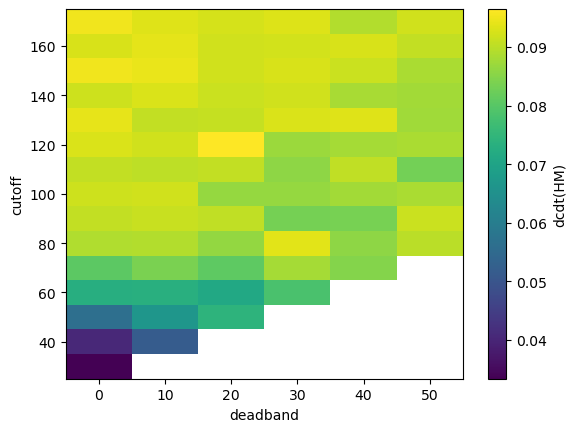

In [147]:
dsMC.isel(time=slice(0,3)).median(dim=['MC','time'])['dcdt(HM)'].plot()

In [148]:
def find_pareto_front(x, y, maximize_x=False, maximize_y=False):
    """
    Find the Pareto front for two objectives
    
    Parameters:
    -----------
    x, y : array-like
        Values of the two objectives
    maximize_x, maximize_y : bool
        Whether to maximize (True) or minimize (False) each objective
    
    Returns:
    --------
    pareto_indices : ndarray
        Indices of points on the Pareto front
    """
    import numpy as np
    
    # Copy arrays to avoid modifying originals
    x_values = np.copy(x)
    y_values = np.copy(y)
    
    # Convert maximization to minimization
    if maximize_x:
        x_values = -x_values
    if maximize_y:
        y_values = -y_values
    
    points = np.column_stack((x_values, y_values))
    pareto_indices = []
    
    for i, point in enumerate(points):
        if np.isnan(point).any():
            continue
            
        dominated = False
        for j, other_point in enumerate(points):
            if i != j and not np.isnan(other_point).any():
                # Check if other_point dominates point (smaller is better)
                if (all(other_point <= point) and any(other_point < point)):
                    dominated = True
                    break
        
        if not dominated:
            pareto_indices.append(i)
    
    return np.array(pareto_indices)


In [149]:
a1 = np.array([[0, 1, 2, 3], [4, 5, 6, 7], [8, 9, 10, 11]])
a2 = np.array([3, 4, 5, 2])

# (a1**2 + a2**2)**(1/2)
a1.flatten()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

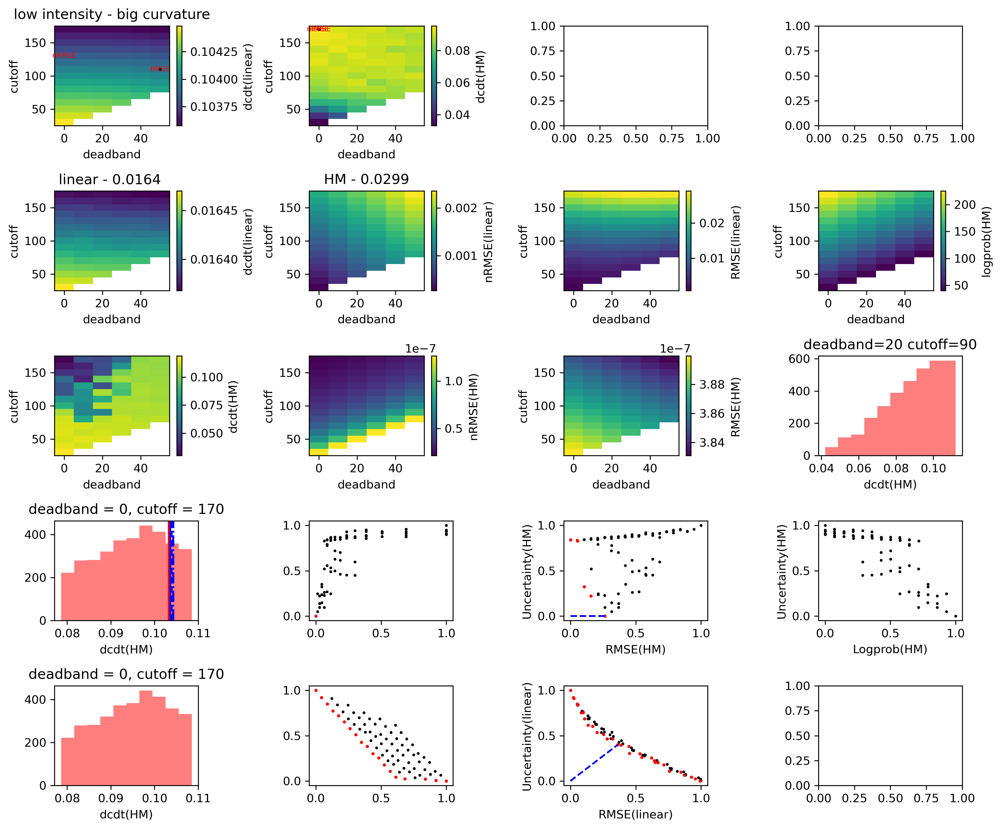

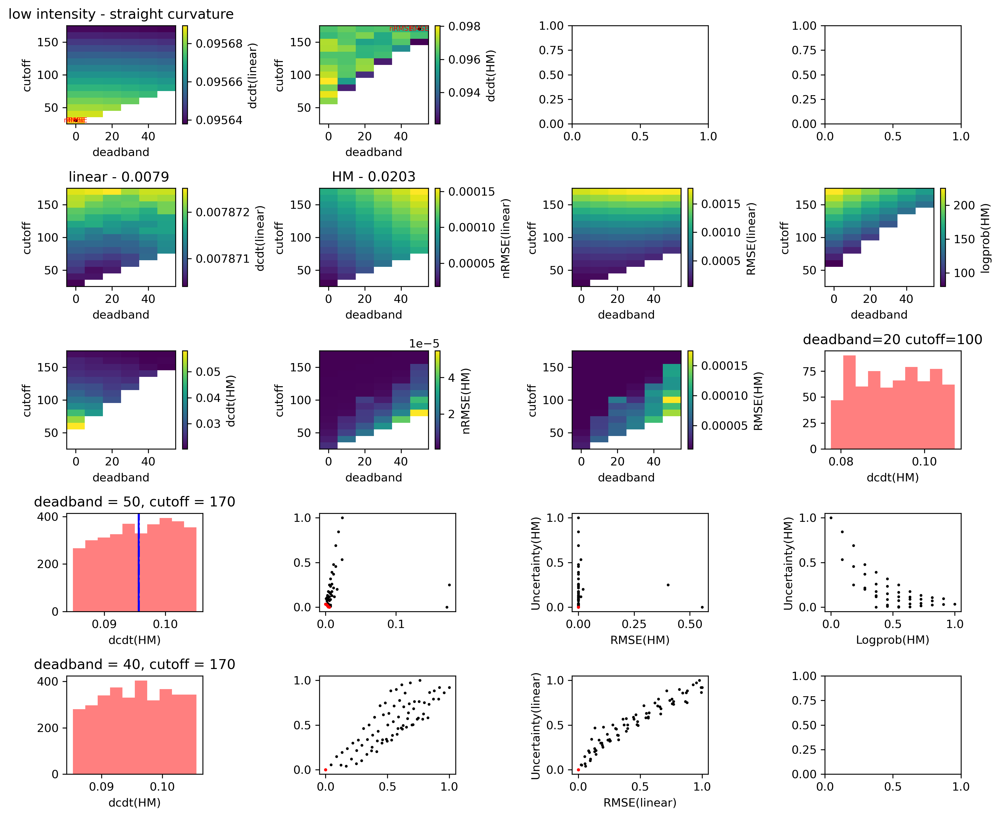

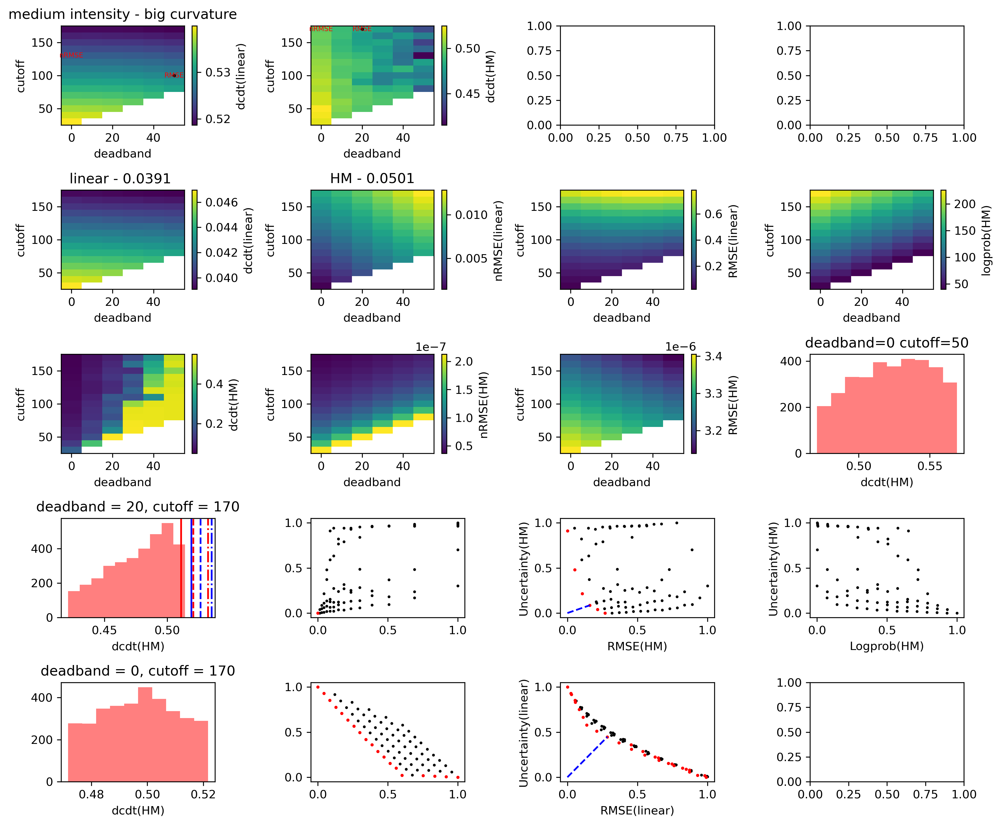

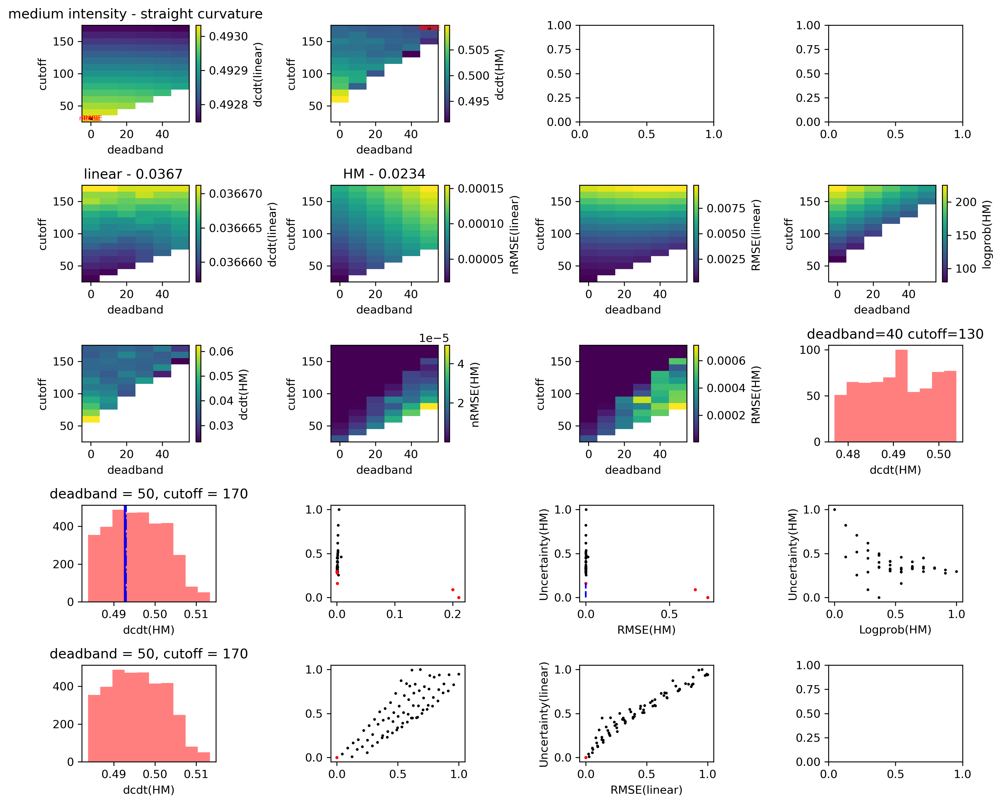

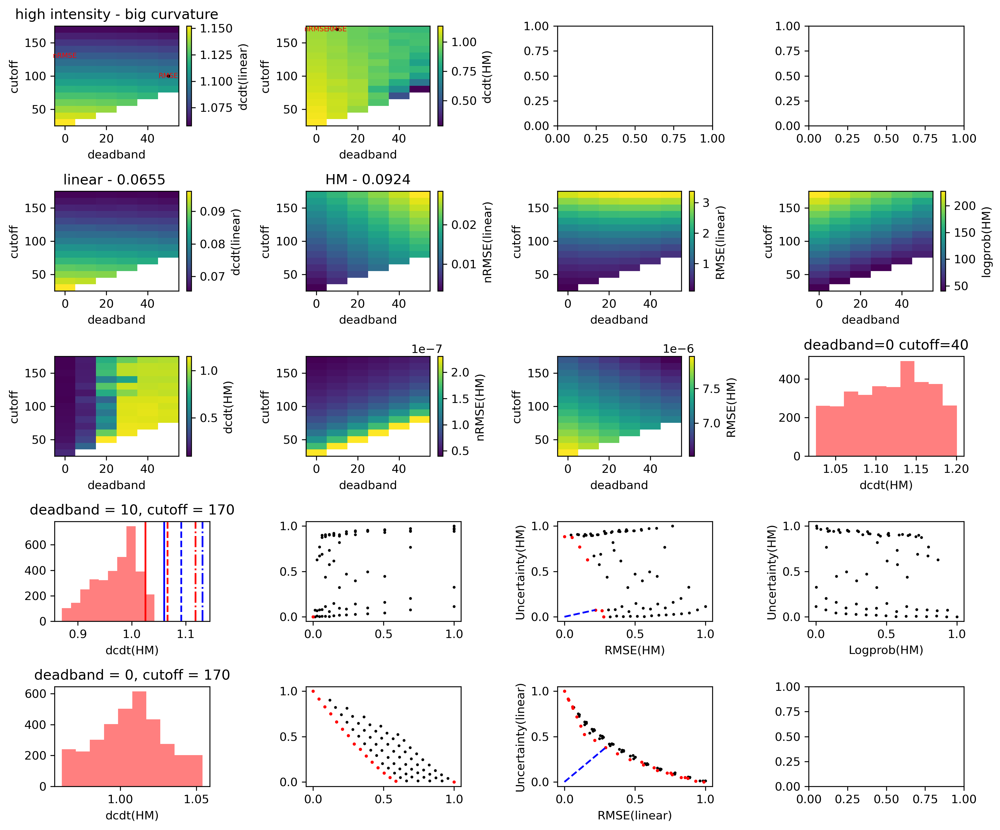

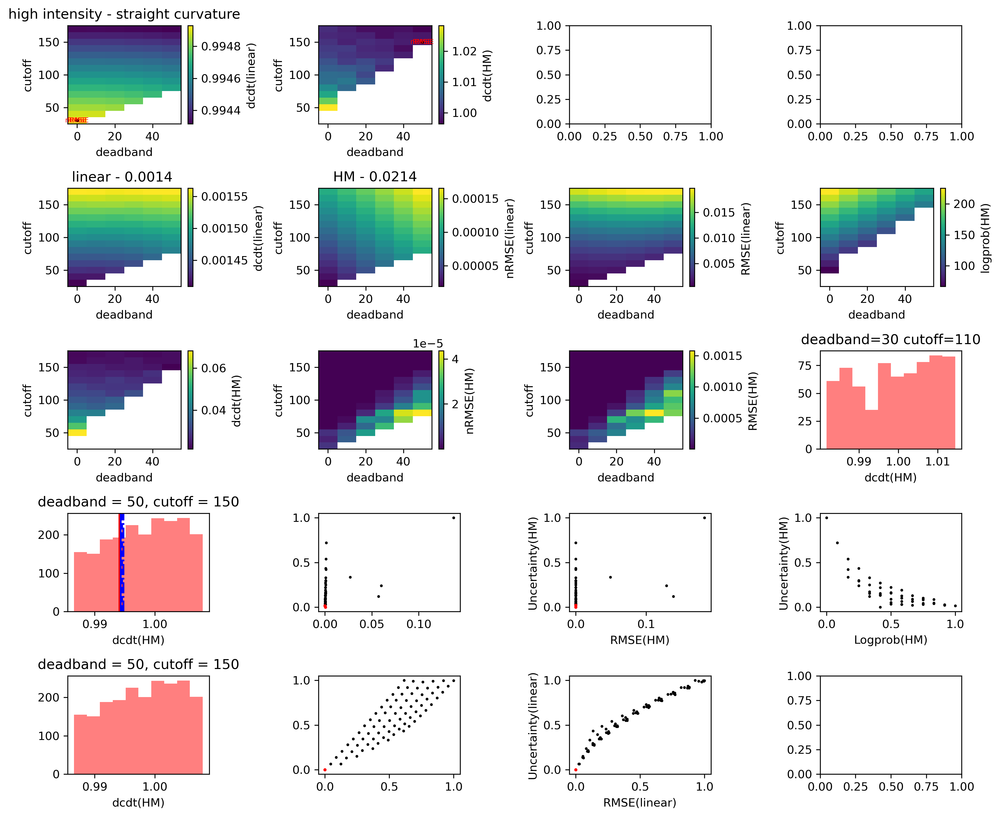

In [150]:
for intensity in ['low', 'medium', 'high']:
    time_intensity = expected_ds.where(expected_ds['intensity_categories'] == intensity, drop=True)
    cutoff_coords, deadband_coords = ds.coords['cutoff'], ds.coords['deadband']
    for curve in np.unique(time_intensity['curvature'].values):
        time_selection = expected_ds.where((expected_ds['intensity_categories'] == intensity) & (expected_ds['curvature'] == curve), drop=True).time.values

        fig, ax = plt.subplots(5, 4, figsize=(12, 10), dpi=300)
        mc_linear = dsMC.sel(time=time_selection).median(dim=['MC','time'])['dcdt(linear)']
        mc_linear_range = dsMC.sel(time=time_selection).quantile(0.84, dim=['MC','time'])['dcdt(linear)']-dsMC.sel(time=time_selection).quantile(0.16, dim=['MC','time'])['dcdt(linear)']
        mc_hm = dsMC.sel(time=time_selection).median(dim=['MC','time'])['dcdt(HM)']
        mc_hm_range = dsMC.sel(time=time_selection).quantile(0.84, dim=['MC','time'])['dcdt(HM)']-dsMC.sel(time=time_selection).quantile(0.16, dim=['MC','time'])['dcdt(HM)']

        minRange_mc_linear = mc_linear_range.argmin(dim=['cutoff', 'deadband'])
        minRange_mc_hm = mc_hm_range.argmin(dim=['cutoff', 'deadband'])
        
        minRange_mc_linear_value = mc_linear_range.min(dim=['cutoff', 'deadband'])
        minRange_mc_hm_value = mc_hm_range.min(dim=['cutoff', 'deadband'])

        aic_hm = ds.sel(time=time_selection)['AIC(HM)'].median(dim='time')
        aic_linear = ds.sel(time=time_selection)['AIC(linear)'].median(dim='time')

        r2_hm = ds.sel(time=time_selection)['R2(HM)'].median(dim='time')
        r2_linear = ds.sel(time=time_selection)['R2(linear)'].median(dim='time')
        rmse_hm = ds.sel(time=time_selection)['RMSE(HM)'].median(dim='time')
        rmse_linear = ds.sel(time=time_selection)['RMSE(linear)'].median(dim='time')

        nrmse_hm = ds.sel(time=time_selection)['nRMSE(HM)'].median(dim='time')
        nrmse_linear = ds.sel(time=time_selection)['nRMSE(linear)'].median(dim='time')

        logprob_hm = -dsMC.sel(time=time_selection).median(dim=['MC','time'])['logprob(HM)']

        # print(aic_hm.values)

        flat_aic_hm = (aic_hm.values.flatten()-np.nanmin(aic_hm.values))/(np.nanmax(aic_hm.values)-np.nanmin(aic_hm.values))
        # flat_aic_hm = (aic_hm.values.flatten()-np.nanmean(aic_hm.values))/(np.nanstd(aic_hm.values))

        flat_r2_hm = (r2_hm.values.flatten()-np.nanmin(r2_hm.values))/(np.nanmax(r2_hm.values)-np.nanmin(r2_hm.values))
        flat_rmse_hm = (rmse_hm.values.flatten()-np.nanmin(rmse_hm.values))/(np.nanmax(rmse_hm.values)-np.nanmin(rmse_hm.values))
        flat_mc_aic_hm_range = (mc_hm_range.values.flatten()-np.nanmin(mc_hm_range.values))/(np.nanmax(mc_hm_range.values)-np.nanmin(mc_hm_range.values))

        flat_aic_linear = aic_linear.values.flatten()
        flat_r2_linear = (r2_linear.values.flatten()-np.nanmin(r2_linear.values))/(np.nanmax(r2_linear.values)-np.nanmin(r2_linear.values))
        flat_rmse_linear = (rmse_linear.values.flatten()-np.nanmin(rmse_linear.values))/(np.nanmax(rmse_linear.values)-np.nanmin(rmse_linear.values))
        flat_mc_aic_linear_range = (mc_linear_range.values.flatten()-np.nanmin(mc_linear_range.values))/(np.nanmax(mc_linear_range.values)-np.nanmin(mc_linear_range.values))

        flat_nrmse_hm = (nrmse_hm.values.flatten()-np.nanmin(nrmse_hm.values))/(np.nanmax(nrmse_hm.values)-np.nanmin(nrmse_hm.values))
        flat_nrmse_linear = (nrmse_linear.values.flatten()-np.nanmin(nrmse_linear.values))/(np.nanmax(nrmse_linear.values)-np.nanmin(nrmse_linear.values))

        flat_logprob_hm = (logprob_hm.values.flatten()-np.nanmin(logprob_hm.values))/(np.nanmax(logprob_hm.values)-np.nanmin(logprob_hm.values))

        pareto_hm_rmse_uncertainty = find_pareto_front(x=flat_rmse_hm,
                                   y=flat_mc_aic_hm_range,
                                   maximize_x=False,
                                   maximize_y=False)
        pareto_hm_aic_uncertainty = find_pareto_front(x=flat_aic_hm,
                                      y=flat_mc_aic_hm_range,
                                      maximize_x=False,
                                      maximize_y=False)
        pareto_hm_nrmse_uncertainty = find_pareto_front(x=flat_nrmse_hm,
                                      y=flat_mc_aic_hm_range,
                                      maximize_x=False,
                                      maximize_y=False)
        pareto_linear_rmse_uncertainty = find_pareto_front(x=flat_rmse_linear,
                                      y=flat_mc_aic_linear_range,
                                      maximize_x=False,
                                      maximize_y=False)
        pareto_linear_aic_uncertainty = find_pareto_front(x=flat_aic_linear,
                                      y=flat_mc_aic_linear_range,
                                      maximize_x=False,
                                      maximize_y=False)
        pareto_linear_nrmse_uncertainty = find_pareto_front(x=flat_nrmse_linear,
                                      y=flat_mc_aic_linear_range,
                                      maximize_x=False,
                                      maximize_y=False)
        pareto_hm_logprob_uncertainty = find_pareto_front(x=flat_logprob_hm,
                                      y=flat_mc_aic_hm_range,
                                      maximize_x=False,
                                      maximize_y=False)

        coords_pareto_hm = np.unravel_index(pareto_hm_rmse_uncertainty, aic_hm.shape)
        coords_pareto_linear = np.unravel_index(pareto_linear_rmse_uncertainty, aic_linear.shape)

        # ax[3,0].scatter(flat_aic_hm, flat_mc_aic_hm_range, color='k', s=2)
        # ax[4,0].scatter(flat_aic_linear, flat_mc_aic_linear_range, color='k', s=2)

        # ax[3,1].scatter(flat_r2_hm, flat_mc_aic_hm_range, color='k', s=2)
        # ax[4,1].scatter(flat_r2_linear, flat_mc_aic_linear_range, color='k', s=2)
        cutoff_tile = np.tile(cutoff_coords.values, len(deadband_coords))

        # ax[3,1].scatter(cutoff_tile, flat_mc_aic_hm_range, color='k', s=2)

        # ax[3,1].scatter(flat_aic_hm, flat_mc_aic_hm_range, color='k', s=2)
        # ax[4,1].scatter(flat_aic_linear, flat_mc_aic_linear_range, color='k', s=2)
        ax[3,1].scatter(flat_nrmse_hm, flat_mc_aic_hm_range, color='k', s=2)
        ax[4,1].scatter(flat_nrmse_linear, flat_mc_aic_linear_range, color='k', s=2)

        ax[3,2].scatter(flat_rmse_hm, flat_mc_aic_hm_range, color='k', s=2)
        ax[4,2].scatter(flat_rmse_linear, flat_mc_aic_linear_range, color='k', s=2)

        ax[3,3].scatter(flat_logprob_hm, flat_mc_aic_hm_range, color='k', s=2)
        ax[3,3].set_xlabel('Logprob(HM)')
        ax[3,3].set_ylabel('Uncertainty(HM)')


        # ax[3,1].scatter(flat_aic_hm[pareto_hm_aic_uncertainty],
        #                 flat_mc_aic_hm_range[pareto_hm_aic_uncertainty], color='red', s=3)
        # ax[4,1].scatter(flat_aic_linear[pareto_linear_aic_uncertainty],
        #                 flat_mc_aic_linear_range[pareto_linear_aic_uncertainty], color='red', s=3)
        ax[3,1].scatter(flat_nrmse_hm[pareto_hm_nrmse_uncertainty], 
                        flat_mc_aic_hm_range[pareto_hm_nrmse_uncertainty], color='red', s=3)
        ax[4,1].scatter(flat_nrmse_linear[pareto_linear_nrmse_uncertainty],
                        flat_mc_aic_linear_range[pareto_linear_nrmse_uncertainty], color='red', s=3)

        ax[3,2].scatter(flat_rmse_hm[pareto_hm_rmse_uncertainty], 
                        flat_mc_aic_hm_range[pareto_hm_rmse_uncertainty], color='red', s=3)
        ax[4,2].scatter(flat_rmse_linear[pareto_linear_rmse_uncertainty], 
                        flat_mc_aic_linear_range[pareto_linear_rmse_uncertainty], color='red', s=3)
        
        distance_hm_rmse = (flat_rmse_hm**2 + flat_mc_aic_hm_range**2)**(1/2)
        argmin_distance_hm_rmse = np.nanargmin(distance_hm_rmse)
        coords_min_distance_hm = np.unravel_index(argmin_distance_hm_rmse, aic_hm.shape)

        distance_hm_nrmse = (flat_nrmse_hm**2 + flat_mc_aic_hm_range**2)**(1/2)
        argmin_distance_hm_nrmse = np.nanargmin(distance_hm_nrmse)
        coords_min_distance_hm_nrmse = np.unravel_index(argmin_distance_hm_nrmse, aic_hm.shape)

        distance_hm_aic = (flat_aic_hm**2 + flat_mc_aic_hm_range**2)**(1/2)
        argmin_distance_hm_aic = np.nanargmin(distance_hm_aic)
        coords_min_distance_hm_aic = np.unravel_index(argmin_distance_hm_aic, aic_hm.shape)

        distance_linear_rmse = (np.sqrt((flat_rmse_linear**2) + (flat_mc_aic_linear_range**2)))
        argmin_distance_linear_rmse = np.nanargmin(distance_linear_rmse)
        coords_min_distance_linear = np.unravel_index(argmin_distance_linear_rmse, aic_linear.shape)

        distance_linear_nrmse = (np.sqrt((flat_nrmse_linear**2) + (flat_mc_aic_linear_range**2)))
        argmin_distance_linear_nrmse = np.nanargmin(distance_linear_nrmse)
        coords_min_distance_linear_nrmse = np.unravel_index(argmin_distance_linear_nrmse, aic_linear.shape)

        distance_linear_aic = (np.sqrt((flat_aic_linear**2) + (flat_mc_aic_linear_range**2)))
        argmin_distance_linear_aic = np.nanargmin(distance_linear_aic)
        coords_min_distance_linear_aic = np.unravel_index(argmin_distance_linear_aic, aic_linear.shape)

        distance_hm_logprob = (np.sqrt((flat_logprob_hm**2) + (flat_mc_aic_hm_range**2)))
        argmin_distance_hm_logprob = np.nanargmin(distance_hm_logprob)
        coords_min_distance_hm_logprob = np.unravel_index(argmin_distance_hm_logprob, aic_hm.shape)


        
        
        
        
        
        ax[3,2].set_xlabel('RMSE(HM)')
        ax[3,2].set_ylabel('Uncertainty(HM)')
        ax[4,2].set_xlabel('RMSE(linear)')
        ax[4,2].set_ylabel('Uncertainty(linear)')


        mc_linear.plot(ax=ax[0,0])
        mc_linear_range.plot(ax=ax[1,0])
        mc_hm.plot(ax=ax[0,1])
        mc_hm_range.plot(ax=ax[2,0])

        nrmse_linear.plot(ax=ax[1,1])
        nrmse_hm.plot(ax=ax[2,1])

        rmse_hm.plot(ax=ax[2,2])
        rmse_linear.plot(ax=ax[1,2])

        logprob_hm.plot(ax=ax[1,3])

        # aic_linear.plot(ax=ax[2,0])
        # aic_hm.plot(ax=ax[2,1])



        # for i in range(len(coords_pareto_hm[0])):
        #     ax[0,1].scatter(deadband_coords[coords_pareto_hm[1][i]],
        #                     cutoff_coords[coords_pareto_hm[0][i]], color='red')

        # for i in range(len(coords_pareto_linear[0])):
        #     ax[0,0].scatter(deadband_coords[coords_pareto_linear[1][i]],
        #                     cutoff_coords[coords_pareto_linear[0][i]], color='red')

        ax[0,1].scatter(deadband_coords[coords_min_distance_hm[1]],
                        cutoff_coords[coords_min_distance_hm[0]], color='k', s=3)
        ax[0,1].text(deadband_coords[coords_min_distance_hm[1]],
                        cutoff_coords[coords_min_distance_hm[0]], 'RMSE', color='red',fontsize=6, ha='center', va='center') 
        ax[0,1].text(deadband_coords[coords_min_distance_hm_nrmse[1]],
                        cutoff_coords[coords_min_distance_hm_nrmse[0]], 'nRMSE', color='red',fontsize=6, ha='center', va='center')
        ax[0,0].scatter(deadband_coords[coords_min_distance_linear[1]],
                        cutoff_coords[coords_min_distance_linear[0]], color='k', s=3)
        ax[0,0].text(deadband_coords[coords_min_distance_linear[1]],
                        cutoff_coords[coords_min_distance_linear[0]], 'RMSE', color='red',fontsize=6, ha='center', va='center')
        ax[0,0].text(deadband_coords[coords_min_distance_linear_nrmse[1]],
                        cutoff_coords[coords_min_distance_linear_nrmse[0]], 'nRMSE', color='red',fontsize=6, ha='center', va='center')

        # ax[3,1].plot([0, flat_aic_hm[argmin_distance_hm_aic]],[0, flat_mc_aic_hm_range[argmin_distance_hm_aic]], color='blue', linestyle='--')
        # ax[4,1].plot([0, flat_aic_linear[argmin_distance_linear_aic]],[0, flat_mc_aic_linear_range[argmin_distance_linear_aic]], color='blue', linestyle='--')

        ax[3,2].plot([0, flat_rmse_hm[argmin_distance_hm_rmse]],[0, flat_mc_aic_hm_range[argmin_distance_hm_rmse]], color='blue', linestyle='--')
        ax[4,2].plot([0, flat_rmse_linear[argmin_distance_linear_rmse]],[0, flat_mc_aic_linear_range[argmin_distance_linear_rmse]], color='blue', linestyle='--')

        # ax[1,0].scatter(deadband_coords[minRange_mc_linear['deadband']],
        #                 cutoff_coords[minRange_mc_linear['cutoff']], color='red')
        # ax[1,1].scatter(deadband_coords[minRange_mc_hm['deadband']],    
        #                 cutoff_coords[minRange_mc_hm['cutoff']], color='red')
        ax[0,0].set_title(f'{intensity} intensity - {curve} curvature')
        ax[1,0].set_title(f'linear - {minRange_mc_linear_value.values:.4f} ')
        ax[1,1].set_title(f'HM - {minRange_mc_hm_value.values:.4f}')


        # print(mc_hm.sel(deadband=deadband_coords[coords_min_distance_hm[1]],
        #             cutoff=cutoff_coords[coords_min_distance_hm[0]]))
        
        hist_hm = dsMC.sel(time=time_selection,
                           deadband=deadband_coords[coords_min_distance_hm[1]],
                           cutoff=cutoff_coords[coords_min_distance_hm[0]])['dcdt(HM)']
        q_hm_final = hist_hm.quantile([0.16, 0.84])
        hist_hm = hist_hm.where((hist_hm > q_hm_final[0]) & (hist_hm < q_hm_final[1]), drop=True)
                 
        hist_linear = dsMC.sel(time=time_selection,
                           deadband=deadband_coords[coords_min_distance_linear[1]],
                           cutoff=cutoff_coords[coords_min_distance_linear[0]])['dcdt(linear)']
        q_linear_final = hist_linear.quantile([0.16, 0.84])
        hist_linear = hist_linear.where((hist_linear > q_linear_final[0]) & (hist_linear < q_linear_final[1]), drop=True)
        
        hist_hm_nrmse = dsMC.sel(time=time_selection,
                           deadband=deadband_coords[coords_min_distance_hm_nrmse[1]],
                           cutoff=cutoff_coords[coords_min_distance_hm_nrmse[0]])['dcdt(HM)']
        q_hm_nrmse_final = hist_hm_nrmse.quantile([0.16, 0.84])
        hist_hm_nrmse = hist_hm_nrmse.where((hist_hm_nrmse > q_hm_nrmse_final[0]) & (hist_hm_nrmse < q_hm_nrmse_final[1]), drop=True)
        hist_linear_nrmse = dsMC.sel(time=time_selection,
                           deadband=deadband_coords[coords_min_distance_linear_nrmse[1]],
                           cutoff=cutoff_coords[coords_min_distance_linear_nrmse[0]])['dcdt(linear)']
        q_linear_nrmse_final = hist_linear_nrmse.quantile([0.16, 0.84])
        hist_linear_nrmse = hist_linear_nrmse.where((hist_linear_nrmse > q_linear_nrmse_final[0]) & (hist_linear_nrmse < q_linear_nrmse_final[1]), drop=True)

        hist_hm_logprob = dsMC.sel(time=time_selection,
                           deadband=deadband_coords[coords_min_distance_hm_logprob[1]],
                           cutoff=cutoff_coords[coords_min_distance_hm_logprob[0]])['dcdt(HM)']
        q_hm_logprob_final = hist_hm_logprob.quantile([0.16, 0.84])
        hist_hm_logprob = hist_hm_logprob.where((hist_hm_logprob > q_hm_logprob_final[0]) & (hist_hm_logprob < q_hm_logprob_final[1]), drop=True)

        hist_hm_logprob.plot.hist(ax=ax[2,3], color='red', alpha=0.5)
        ax[2,3].set_title(f'deadband={deadband_coords[coords_min_distance_hm_logprob[1]].values} cutoff={cutoff_coords[coords_min_distance_hm_logprob[0]].values}')


        hist_hm.plot.hist(ax=ax[3,0], color='red', alpha=0.5)
        # hist_linear.plot.hist(ax=ax[3,0], color='blue', alpha=0.5)

        hist_hm_nrmse.plot.hist(ax=ax[4,0], color='red', alpha=0.5)
        # hist_linear_nrmse.plot.hist(ax=ax[4,0], color='blue', alpha=0.5)


        # ax[3,1].set_xscale('log')
        # ax[3,1].set_yscale('log')

        arb_0_170 = ds.sel(time=time_selection,
                           deadband=0,
                           cutoff=170)['dcdt(HM)']
        arb_0_120 = ds.sel(time=time_selection,
                           deadband=0,
                           cutoff=120)['dcdt(HM)']
        arb_0_60 = ds.sel(time=time_selection,
                           deadband=0,
                           cutoff=60)['dcdt(HM)']
        
        arb_l_0_170 = ds.sel(time=time_selection,
                           deadband=0,
                           cutoff=170)['dcdt(linear)']
        arb_l_0_120 = ds.sel(time=time_selection,
                           deadband=0,
                           cutoff=120)['dcdt(linear)']
        arb_l_0_60 = ds.sel(time=time_selection,
                           deadband=0,
                           cutoff=60)['dcdt(linear)']
        
        
        ax[3,0].axvline(x=arb_0_170.median(), color='red')
        ax[3,0].axvline(x=arb_0_120.median(), color='red', linestyle='--')
        ax[3,0].axvline(x=arb_0_60.median(), color='red', linestyle='-.')

        ax[3,0].axvline(x=arb_l_0_170.median(), color='blue')
        ax[3,0].axvline(x=arb_l_0_120.median(), color='blue', linestyle='--')
        ax[3,0].axvline(x=arb_l_0_60.median(), color='blue', linestyle='-.')


        fig.tight_layout()
        # break


In [151]:
deadband_coords[coords_min_distance_hm[1]], cutoff_coords[coords_min_distance_hm[0]]

(<xarray.DataArray 'deadband' ()> Size: 4B
 array(50, dtype=int32)
 Coordinates:
     deadband  int32 4B 50,
 <xarray.DataArray 'cutoff' ()> Size: 4B
 array(150, dtype=int32)
 Coordinates:
     cutoff   int32 4B 150)

In [152]:
ds.sel(time=time_selection,
       deadband=deadband_coords[coords_min_distance_hm[1]],
       cutoff=cutoff_coords[coords_min_distance_hm[0]])['dcdt(HM)'].median(dim='time')

<xarray.DataArray 'dcdt(HM)' ()> Size: 8B
array(0.9939184)
Coordinates:
    deadband  int32 4B 50
    cutoff    int32 4B 150

In [153]:
dsMC.isel(time=10)

<xarray.Dataset> Size: 4MB
Dimensions:        (cutoff: 15, deadband: 6, MC: 1000)
Coordinates:
    time           datetime64[ns] 8B 2025-05-08T15:52:56
  * deadband       (deadband) int32 24B 0 10 20 30 40 50
  * cutoff         (cutoff) int32 60B 30 40 50 60 70 80 ... 130 140 150 160 170
  * MC             (MC) int32 4kB 0 1 2 3 4 5 6 ... 993 994 995 996 997 998 999
Data variables:
    dcdt(HM)       (cutoff, deadband, MC) float32 360kB ...
    dcdt(linear)   (cutoff, deadband, MC) float32 360kB ...
    AIC(HM)        (cutoff, deadband, MC) float32 360kB ...
    AIC(linear)    (cutoff, deadband, MC) float32 360kB ...
    RMSE(HM)       (cutoff, deadband, MC) float32 360kB ...
    RMSE(linear)   (cutoff, deadband, MC) float32 360kB ...
    R2(HM)         (cutoff, deadband, MC) float32 360kB ...
    R2(linear)     (cutoff, deadband, MC) float32 360kB ...
    nRMSE(HM)      (cutoff, deadband, MC) float32 360kB ...
    nRMSE(linear)  (cutoff, deadband, MC) float32 360kB ...
    logprob(HM)    (cutoff, deadband, MC) float32 360kB ...

In [154]:
dsMC.sel(time=time_selection,
        deadband=deadband_coords[coords_min_distance_hm[1]],
        cutoff=cutoff_coords[coords_min_distance_hm[0]])['logprob(HM)'].median(dim=['MC','time'])

<xarray.DataArray 'logprob(HM)' ()> Size: 8B
array(-132.73396301)
Coordinates:
    deadband  int32 4B 50
    cutoff    int32 4B 150

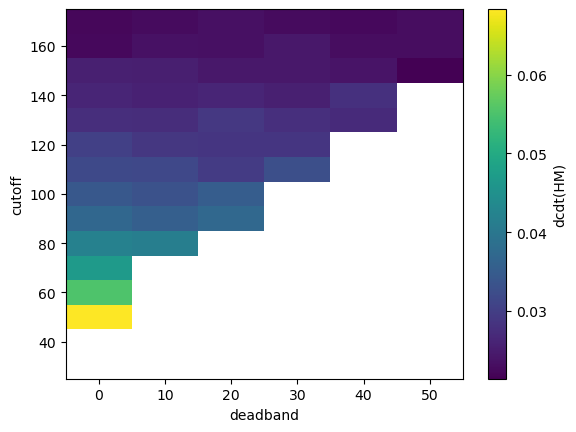

In [155]:
(dsMC.sel(time=time_selection).quantile(0.84, dim=['time', 'MC'],skipna=True)['dcdt(HM)']-dsMC.sel(time=time_selection).quantile(0.16,skipna=True, dim=['time','MC'])['dcdt(HM)']).plot()

In [156]:
dsMC.sel(time=time_selection,
        deadband=deadband_coords[coords_min_distance_hm[1]],
        cutoff=cutoff_coords[coords_min_distance_hm[0]])['logprob(HM)'].median(dim='MC')

<xarray.DataArray 'logprob(HM)' (time: 5)> Size: 40B
array([          nan,           nan, -132.73500061, -132.75016785,
       -132.72967529])
Coordinates:
  * time      (time) datetime64[ns] 40B 2025-05-08T16:25:56 ... 2025-05-08T16...
    deadband  int32 4B 50
    cutoff    int32 4B 150

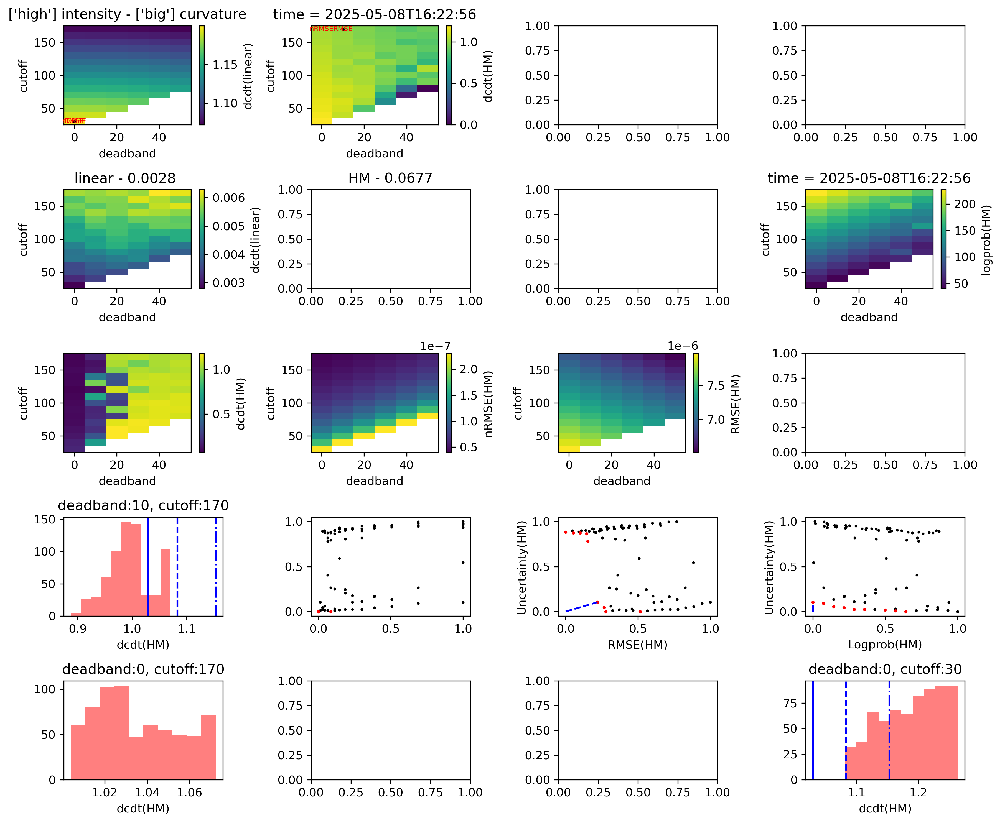

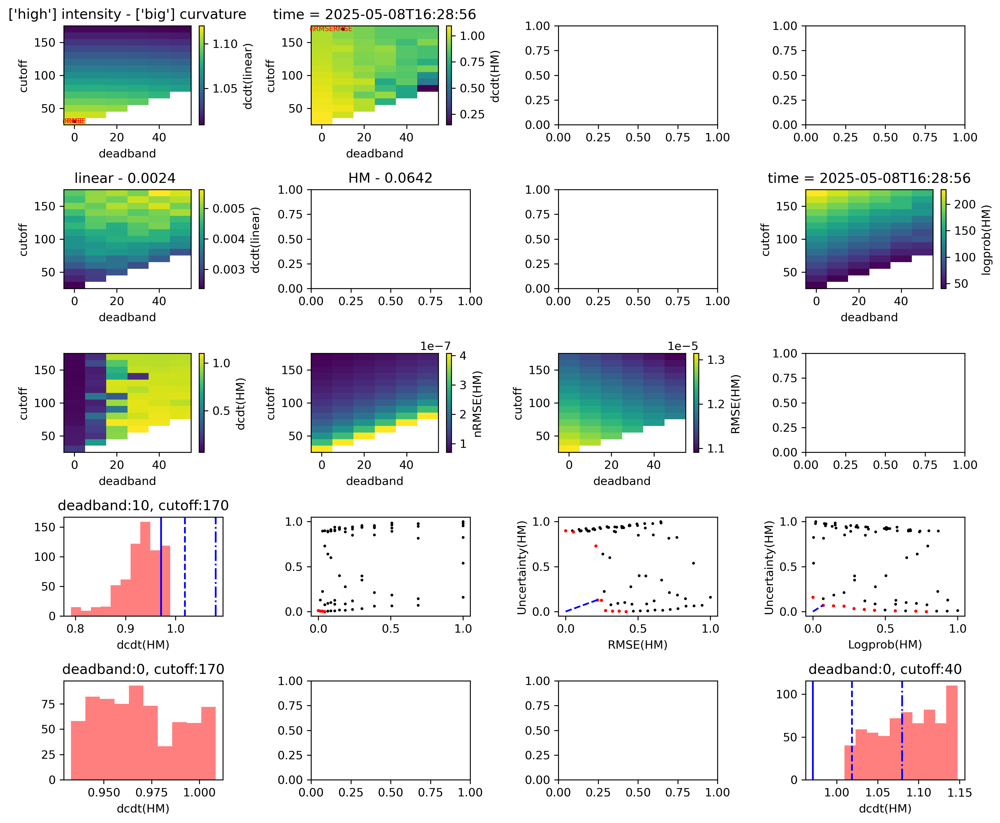

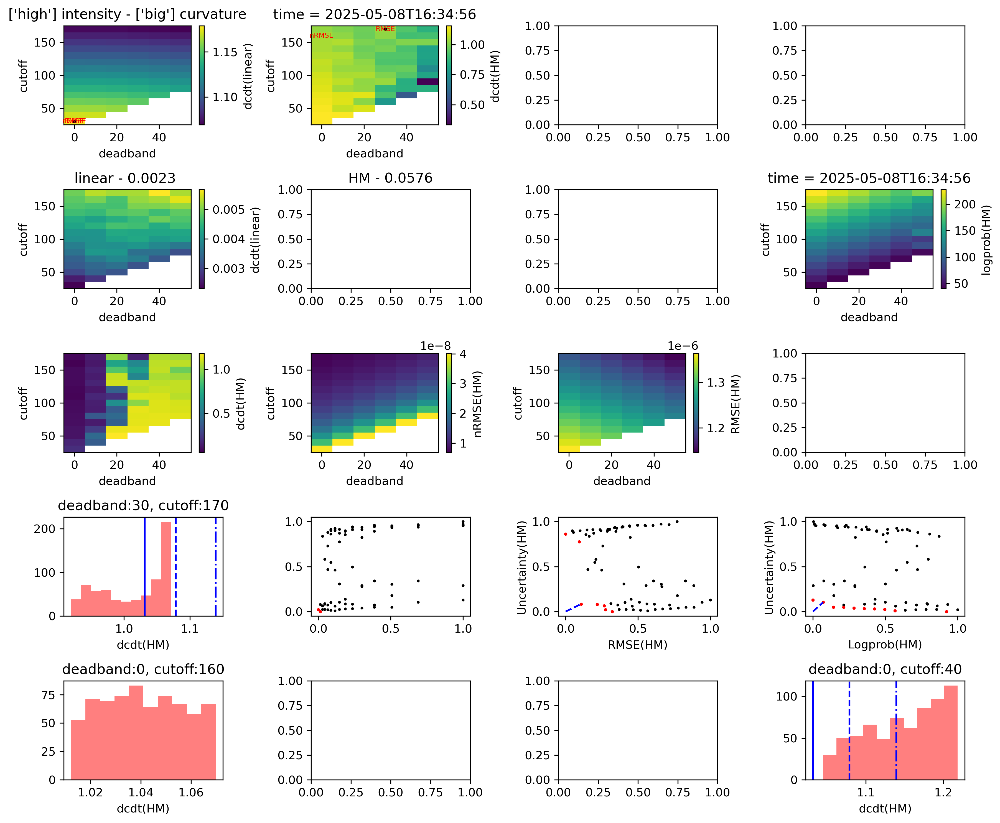

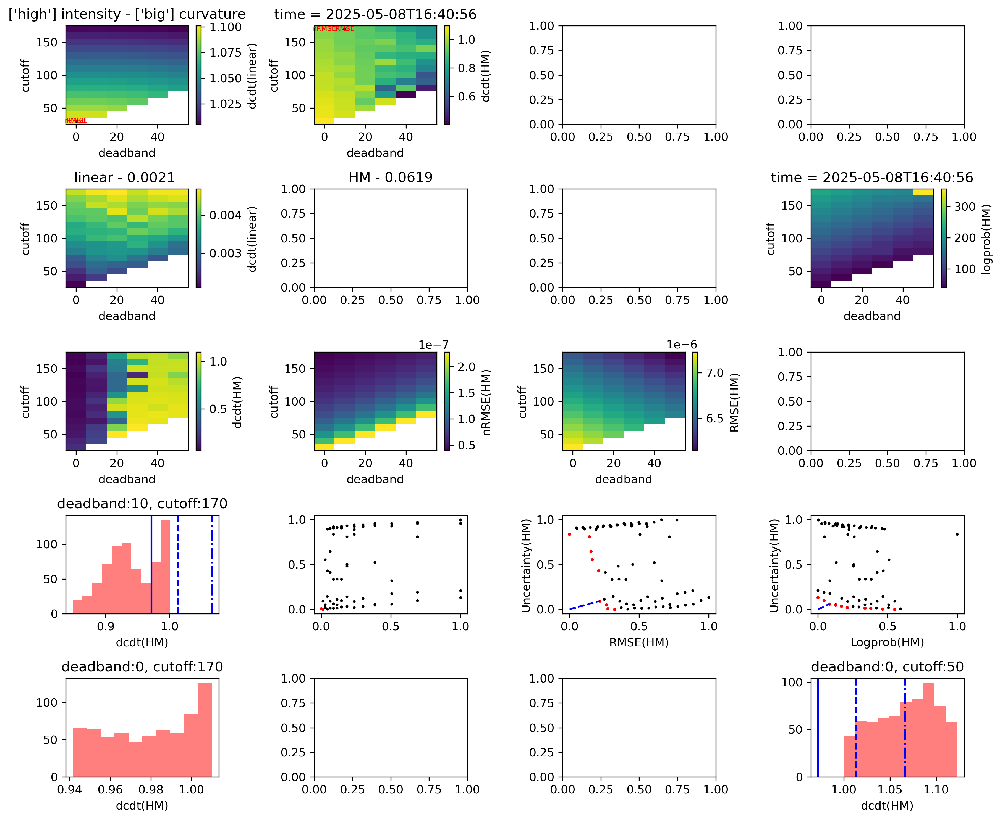

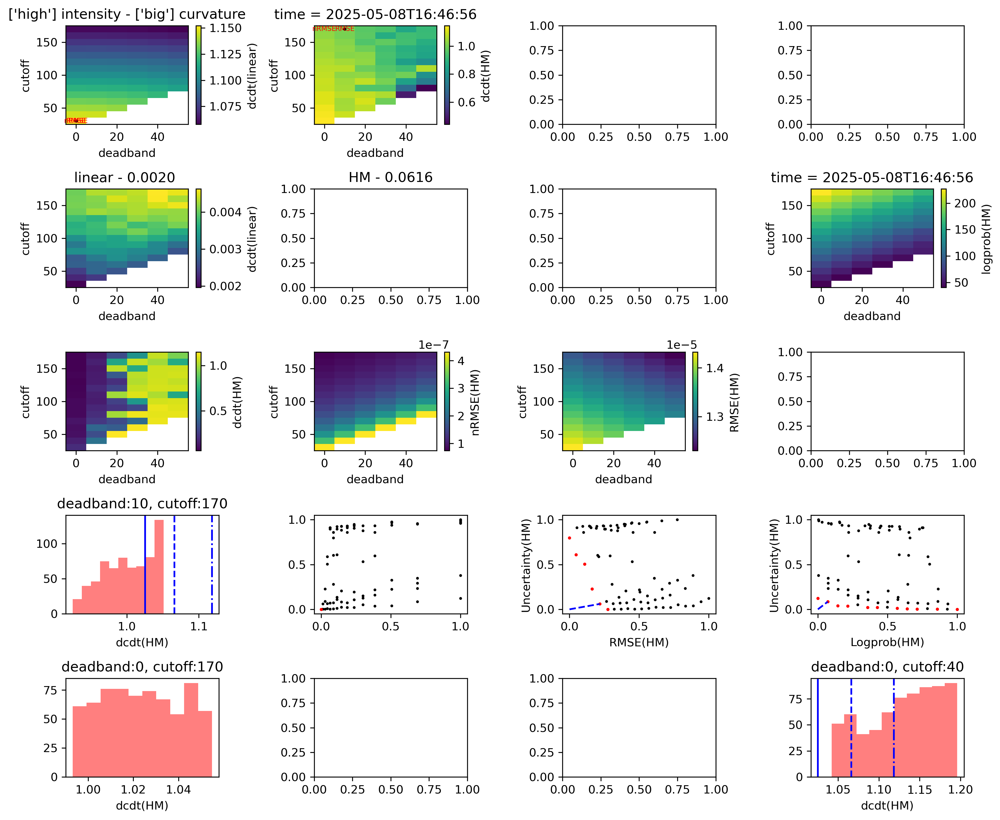

In [157]:
for time in expected_ds['time'].values:
    time_selection = expected_ds.where(expected_ds['time'] == time, drop=True).time.values
    # print(time_selection)
    intensity = expected_ds.where(expected_ds['time'] == time, drop=True).intensity_categories.values
    curve = expected_ds.where(expected_ds['time'] == time, drop=True).curvature.values

    if not (intensity == 'high'): #low, medium, high
        continue
    if not (curve == 'big'): # big, inbetween, straight
        continue

    fig, ax = plt.subplots(5, 4, figsize=(12, 10), dpi=300)
    mc_linear = dsMC.sel(time=time_selection).median(dim=['MC'])['dcdt(linear)']
    mc_linear_range = dsMC.sel(time=time_selection).quantile(0.84, dim=['MC'])['dcdt(linear)']-dsMC.sel(time=time_selection).quantile(0.16, dim=['MC'])['dcdt(linear)']
    mc_hm = dsMC.sel(time=time_selection).median(dim=['MC'])['dcdt(HM)']
    mc_hm_range = dsMC.sel(time=time_selection).quantile(0.84, dim=['time','MC'])['dcdt(HM)']-dsMC.sel(time=time_selection).quantile(0.16, dim=['time','MC'])['dcdt(HM)']

    minRange_mc_linear = mc_linear_range.argmin(dim=['cutoff', 'deadband'])
    minRange_mc_hm = mc_hm_range.argmin(dim=['cutoff', 'deadband'])
    
    minRange_mc_linear_value = mc_linear_range.min(dim=['cutoff', 'deadband'])
    minRange_mc_hm_value = mc_hm_range.min(dim=['cutoff', 'deadband'])

    aic_hm = ds.sel(time=time_selection)['AIC(HM)'].median(dim='time')
    aic_linear = ds.sel(time=time_selection)['AIC(linear)'].median(dim='time')

    r2_hm = ds.sel(time=time_selection)['R2(HM)'].median(dim='time')
    r2_linear = ds.sel(time=time_selection)['R2(linear)'].median(dim='time')
    rmse_hm = ds.sel(time=time_selection)['RMSE(HM)'].median(dim='time')
    # rmse_hm = dsMC.sel(time=time_selection).median(dim=['MC'])['RMSE(HM)']
    rmse_linear = ds.sel(time=time_selection)['RMSE(linear)'].median(dim='time')

    nrmse_hm = ds.sel(time=time_selection)['nRMSE(HM)'].median(dim='time')
    # nrmse_hm = dsMC.sel(time=time_selection)['nRMSE(HM)'].median(dim=['MC'])
    nrmse_linear = ds.sel(time=time_selection)['nRMSE(linear)'].median(dim='time')

    logprob_hm = -dsMC.sel(time=time_selection)['logprob(HM)'].median(dim='MC')

    
    # print(rmse_hm)

    flat_aic_hm = (aic_hm.values.flatten()-np.nanmin(aic_hm.values))/(np.nanmax(aic_hm.values)-np.nanmin(aic_hm.values))
    # flat_aic_hm = (aic_hm.values.flatten()-np.nanmean(aic_hm.values))/(np.nanstd(aic_hm.values))

    flat_r2_hm = (r2_hm.values.flatten()-np.nanmin(r2_hm.values))/(np.nanmax(r2_hm.values)-np.nanmin(r2_hm.values))
    flat_rmse_hm = (rmse_hm.values.flatten()-np.nanmin(rmse_hm.values))/(np.nanmax(rmse_hm.values)-np.nanmin(rmse_hm.values))
    flat_mc_aic_hm_range = (mc_hm_range.values.flatten()-np.nanmin(mc_hm_range.values))/(np.nanmax(mc_hm_range.values)-np.nanmin(mc_hm_range.values))

    flat_aic_linear = aic_linear.values.flatten()
    flat_r2_linear = (r2_linear.values.flatten()-np.nanmin(r2_linear.values))/(np.nanmax(r2_linear.values)-np.nanmin(r2_linear.values))
    flat_rmse_linear = (rmse_linear.values.flatten()-np.nanmin(rmse_linear.values))/(np.nanmax(rmse_linear.values)-np.nanmin(rmse_linear.values))
    flat_mc_aic_linear_range = (mc_linear_range.values.flatten()-np.nanmin(mc_linear_range.values))/(np.nanmax(mc_linear_range.values)-np.nanmin(mc_linear_range.values))

    flat_nrmse_hm = (nrmse_hm.values.flatten()-np.nanmin(nrmse_hm.values))/(np.nanmax(nrmse_hm.values)-np.nanmin(nrmse_hm.values))
    flat_nrmse_linear = (nrmse_linear.values.flatten()-np.nanmin(nrmse_linear.values))/(np.nanmax(nrmse_linear.values)-np.nanmin(nrmse_linear.values))

    flat_logprob_hm = logprob_hm.values.flatten()
    flat_logprob_hm = (logprob_hm.values.flatten()-np.nanmin(logprob_hm.values))/(np.nanmax(logprob_hm.values)-np.nanmin(logprob_hm.values))

    pareto_hm_rmse_uncertainty = find_pareto_front(x=flat_rmse_hm,
                                y=flat_mc_aic_hm_range,
                                maximize_x=False,
                                maximize_y=False)
    pareto_hm_aic_uncertainty = find_pareto_front(x=flat_aic_hm,
                                    y=flat_mc_aic_hm_range,
                                    maximize_x=False,
                                    maximize_y=False)
    pareto_hm_nrmse_uncertainty = find_pareto_front(x=flat_nrmse_hm,
                                    y=flat_mc_aic_hm_range,
                                    maximize_x=False,
                                    maximize_y=False)
    pareto_linear_rmse_uncertainty = find_pareto_front(x=flat_rmse_linear,
                                    y=flat_mc_aic_linear_range,
                                    maximize_x=False,
                                    maximize_y=False)
    pareto_linear_aic_uncertainty = find_pareto_front(x=flat_aic_linear,
                                    y=flat_mc_aic_linear_range,
                                    maximize_x=False,
                                    maximize_y=False)
    pareto_linear_nrmse_uncertainty = find_pareto_front(x=flat_nrmse_linear,
                                    y=flat_mc_aic_linear_range,
                                    maximize_x=False,
                                    maximize_y=False)
    
    pareto_hm_logprob_uncertainty = find_pareto_front(x=flat_logprob_hm,
                                    y=flat_mc_aic_hm_range,
                                    maximize_x=False,
                                    maximize_y=False)

    coords_pareto_hm = np.unravel_index(pareto_hm_rmse_uncertainty, aic_hm.shape)
    coords_pareto_linear = np.unravel_index(pareto_linear_rmse_uncertainty, aic_linear.shape)

    # ax[3,0].scatter(flat_aic_hm, flat_mc_aic_hm_range, color='k', s=2)
    # ax[4,0].scatter(flat_aic_linear, flat_mc_aic_linear_range, color='k', s=2)

    # ax[3,1].scatter(flat_r2_hm, flat_mc_aic_hm_range, color='k', s=2)
    # ax[4,1].scatter(flat_r2_linear, flat_mc_aic_linear_range, color='k', s=2)
    cutoff_tile = np.tile(cutoff_coords.values, len(deadband_coords))

    # ax[3,1].scatter(cutoff_tile, flat_mc_aic_hm_range, color='k', s=2)

    # ax[3,1].scatter(flat_aic_hm, flat_mc_aic_hm_range, color='k', s=2)
    # ax[4,1].scatter(flat_aic_linear, flat_mc_aic_linear_range, color='k', s=2)
    ax[3,1].scatter(flat_nrmse_hm, flat_mc_aic_hm_range, color='k', s=2)
    #ax[4,1].scatter(flat_nrmse_linear, flat_mc_aic_linear_range, color='k', s=2)

    ax[3,2].scatter(flat_rmse_hm, flat_mc_aic_hm_range, color='k', s=2)
    #ax[4,2].scatter(flat_rmse_linear, flat_mc_aic_linear_range, color='k', s=2)
    ax[3,3].scatter(flat_logprob_hm, flat_mc_aic_hm_range, color='k', s=2)


    # ax[3,1].scatter(flat_aic_hm[pareto_hm_aic_uncertainty],
    #                 flat_mc_aic_hm_range[pareto_hm_aic_uncertainty], color='red', s=3)
    # ax[4,1].scatter(flat_aic_linear[pareto_linear_aic_uncertainty],
    #                 flat_mc_aic_linear_range[pareto_linear_aic_uncertainty], color='red', s=3)
    ax[3,1].scatter(flat_nrmse_hm[pareto_hm_nrmse_uncertainty], 
                    flat_mc_aic_hm_range[pareto_hm_nrmse_uncertainty], color='red', s=3)
    # ax[4,1].scatter(flat_nrmse_linear[pareto_linear_nrmse_uncertainty],
    #                 flat_mc_aic_linear_range[pareto_linear_nrmse_uncertainty], color='red', s=3)

    ax[3,2].scatter(flat_rmse_hm[pareto_hm_rmse_uncertainty], 
                    flat_mc_aic_hm_range[pareto_hm_rmse_uncertainty], color='red', s=3)
    # ax[4,2].scatter(flat_rmse_linear[pareto_linear_rmse_uncertainty], 
    #                 flat_mc_aic_linear_range[pareto_linear_rmse_uncertainty], color='red', s=3)
    ax[3,3].scatter(flat_logprob_hm[pareto_hm_logprob_uncertainty],
                    flat_mc_aic_hm_range[pareto_hm_logprob_uncertainty], color='red', s=3)
    
    distance_hm_rmse = (flat_rmse_hm**2 + flat_mc_aic_hm_range**2)**(1/2)
    argmin_distance_hm_rmse = np.nanargmin(distance_hm_rmse)
    coords_min_distance_hm = np.unravel_index(argmin_distance_hm_rmse, aic_hm.shape)

    distance_hm_nrmse = (flat_nrmse_hm**2 + flat_mc_aic_hm_range**2)**(1/2)
    argmin_distance_hm_nrmse = np.nanargmin(distance_hm_nrmse)
    coords_min_distance_hm_nrmse = np.unravel_index(argmin_distance_hm_nrmse, aic_hm.shape)

    distance_hm_aic = (flat_aic_hm**2 + flat_mc_aic_hm_range**2)**(1/2)
    argmin_distance_hm_aic = np.nanargmin(distance_hm_aic)
    coords_min_distance_hm_aic = np.unravel_index(argmin_distance_hm_aic, aic_hm.shape)

    distance_linear_rmse = (np.sqrt((flat_rmse_linear**2) + (flat_mc_aic_linear_range**2)))
    argmin_distance_linear_rmse = np.nanargmin(distance_linear_rmse)
    coords_min_distance_linear = np.unravel_index(argmin_distance_linear_rmse, aic_linear.shape)

    distance_linear_nrmse = (np.sqrt((flat_nrmse_linear**2) + (flat_mc_aic_linear_range**2)))
    argmin_distance_linear_nrmse = np.nanargmin(distance_linear_nrmse)
    coords_min_distance_linear_nrmse = np.unravel_index(argmin_distance_linear_nrmse, aic_linear.shape)

    distance_linear_aic = (np.sqrt((flat_aic_linear**2) + (flat_mc_aic_linear_range**2)))
    argmin_distance_linear_aic = np.nanargmin(distance_linear_aic)
    coords_min_distance_linear_aic = np.unravel_index(argmin_distance_linear_aic, aic_linear.shape)

    distance_hm_logprob = (np.sqrt((flat_logprob_hm**2) + (flat_mc_aic_hm_range**2)))
    argmin_distance_hm_logprob = np.nanargmin(distance_hm_logprob)
    coords_min_distance_hm_logprob = np.unravel_index(argmin_distance_hm_logprob, aic_hm.shape)
    
    
    
    
    
    ax[3,2].set_xlabel('RMSE(HM)')
    ax[3,2].set_ylabel('Uncertainty(HM)')

    ax[3,3].set_xlabel('Logprob(HM)')
    ax[3,3].set_ylabel('Uncertainty(HM)')
    #ax[4,2].set_xlabel('RMSE(linear)')
    #ax[4,2].set_ylabel('Uncertainty(linear)')


    mc_linear.plot(ax=ax[0,0])
    mc_linear_range.plot(ax=ax[1,0])
    mc_hm.plot(ax=ax[0,1])
    mc_hm_range.plot(ax=ax[2,0])

    #nrmse_linear.plot(ax=ax[1,1])
    nrmse_hm.plot(ax=ax[2,1])

    rmse_hm.plot(ax=ax[2,2])
    #rmse_linear.plot(ax=ax[1,2])

    logprob_hm.plot(ax=ax[1,3])

    # aic_linear.plot(ax=ax[2,0])
    # aic_hm.plot(ax=ax[2,1])



    # for i in range(len(coords_pareto_hm[0])):
    #     ax[0,1].scatter(deadband_coords[coords_pareto_hm[1][i]],
    #                     cutoff_coords[coords_pareto_hm[0][i]], color='red')

    # for i in range(len(coords_pareto_linear[0])):
    #     ax[0,0].scatter(deadband_coords[coords_pareto_linear[1][i]],
    #                     cutoff_coords[coords_pareto_linear[0][i]], color='red')

    ax[0,1].scatter(deadband_coords[coords_min_distance_hm[1]],
                    cutoff_coords[coords_min_distance_hm[0]], color='k', s=3)
    ax[0,1].text(deadband_coords[coords_min_distance_hm[1]],
                    cutoff_coords[coords_min_distance_hm[0]], 'RMSE', color='red',fontsize=6, ha='center', va='center') 
    ax[0,1].text(deadband_coords[coords_min_distance_hm_nrmse[1]],
                    cutoff_coords[coords_min_distance_hm_nrmse[0]], 'nRMSE', color='red',fontsize=6, ha='center', va='center')
    ax[0,0].scatter(deadband_coords[coords_min_distance_linear[1]],
                    cutoff_coords[coords_min_distance_linear[0]], color='k', s=3)
    ax[0,0].text(deadband_coords[coords_min_distance_linear[1]],
                    cutoff_coords[coords_min_distance_linear[0]], 'RMSE', color='red',fontsize=6, ha='center', va='center')
    ax[0,0].text(deadband_coords[coords_min_distance_linear_nrmse[1]],
                    cutoff_coords[coords_min_distance_linear_nrmse[0]], 'nRMSE', color='red',fontsize=6, ha='center', va='center')

    # ax[3,1].plot([0, flat_aic_hm[argmin_distance_hm_aic]],[0, flat_mc_aic_hm_range[argmin_distance_hm_aic]], color='blue', linestyle='--')
    # ax[4,1].plot([0, flat_aic_linear[argmin_distance_linear_aic]],[0, flat_mc_aic_linear_range[argmin_distance_linear_aic]], color='blue', linestyle='--')

    ax[3,2].plot([0, flat_rmse_hm[argmin_distance_hm_rmse]],[0, flat_mc_aic_hm_range[argmin_distance_hm_rmse]], color='blue', linestyle='--')

    ax[3,3].plot([0, flat_logprob_hm[argmin_distance_hm_logprob]],[0, flat_mc_aic_hm_range[argmin_distance_hm_logprob]], color='blue', linestyle='--')
    #ax[4,2].plot([0, flat_rmse_linear[argmin_distance_linear_rmse]],[0, flat_mc_aic_linear_range[argmin_distance_linear_rmse]], color='blue', linestyle='--')

    # ax[1,0].scatter(deadband_coords[minRange_mc_linear['deadband']],
    #                 cutoff_coords[minRange_mc_linear['cutoff']], color='red')
    # ax[1,1].scatter(deadband_coords[minRange_mc_hm['deadband']],    
    #                 cutoff_coords[minRange_mc_hm['cutoff']], color='red')
    ax[0,0].set_title(f'{intensity} intensity - {curve} curvature')
    # print(minRange_mc_linear_value.values)
    ax[1,0].set_title(f'linear - {minRange_mc_linear_value.values[0]:.4f} ')
    ax[1,1].set_title(f'HM - {minRange_mc_hm_value.values:.4f}')


    # print(mc_hm.sel(deadband=deadband_coords[coords_min_distance_hm[1]],
    #             cutoff=cutoff_coords[coords_min_distance_hm[0]]))
    
    hist_hm = dsMC.sel(time=time_selection,
                        deadband=deadband_coords[coords_min_distance_hm[1]],
                        cutoff=cutoff_coords[coords_min_distance_hm[0]])['dcdt(HM)']
    q_hm_final = hist_hm.quantile([0.16, 0.84])
    hist_hm = hist_hm.where((hist_hm > q_hm_final[0]) & (hist_hm < q_hm_final[1]), drop=True)

                
    hist_linear = dsMC.sel(time=time_selection,
                        deadband=deadband_coords[coords_min_distance_linear[1]],
                        cutoff=cutoff_coords[coords_min_distance_linear[0]])['dcdt(linear)']
    q_linear_final = hist_linear.quantile([0.16, 0.84])
    hist_linear = hist_linear.where((hist_linear > q_linear_final[0]) & (hist_linear < q_linear_final[1]), drop=True)
    
    hist_hm_nrmse = dsMC.sel(time=time_selection,
                        deadband=deadband_coords[coords_min_distance_hm_nrmse[1]],
                        cutoff=cutoff_coords[coords_min_distance_hm_nrmse[0]])['dcdt(HM)']
    q_hm_nrmse_final = hist_hm_nrmse.quantile([0.16, 0.84])
    hist_hm_nrmse = hist_hm_nrmse.where((hist_hm_nrmse > q_hm_nrmse_final[0]) & (hist_hm_nrmse < q_hm_nrmse_final[1]), drop=True)
    hist_linear_nrmse = dsMC.sel(time=time_selection,
                        deadband=deadband_coords[coords_min_distance_linear_nrmse[1]],
                        cutoff=cutoff_coords[coords_min_distance_linear_nrmse[0]])['dcdt(linear)']
    q_linear_nrmse_final = hist_linear_nrmse.quantile([0.16, 0.84])
    hist_linear_nrmse = hist_linear_nrmse.where((hist_linear_nrmse > q_linear_nrmse_final[0]) & (hist_linear_nrmse < q_linear_nrmse_final[1]), drop=True)

    hist_hm_logprob = dsMC.sel(time=time_selection,
                        deadband=deadband_coords[coords_min_distance_hm_logprob[1]],
                        cutoff=cutoff_coords[coords_min_distance_hm_logprob[0]])['dcdt(HM)']
    q_hm_logprob_final = hist_hm_logprob.quantile([0.16, 0.84])
    hist_hm_logprob = hist_hm_logprob.where((hist_hm_logprob > q_hm_logprob_final[0]) & (hist_hm_logprob < q_hm_logprob_final[1]), drop=True)

    try:


        hist_hm.plot.hist(ax=ax[3,0], color='red', alpha=0.5)
        # hist_linear.plot.hist(ax=ax[3,0], color='blue', alpha=0.5)
        ax[3,0].set_title(f'deadband:{deadband_coords[coords_min_distance_hm[1]].values}, cutoff:{cutoff_coords[coords_min_distance_hm[0]].values}')

        hist_hm_nrmse.plot.hist(ax=ax[4,0], color='red', alpha=0.5)
        ax[4,0].set_title(f'deadband:{deadband_coords[coords_min_distance_hm_nrmse[1]].values}, cutoff:{cutoff_coords[coords_min_distance_hm_nrmse[0]].values}')
        # hist_linear_nrmse.plot.hist(ax=ax[4,0], color='blue', alpha=0.5)


        hist_hm_logprob.plot.hist(ax=ax[4,3], color='red', alpha=0.5)
        ax[4,3].set_title(f'deadband:{deadband_coords[coords_min_distance_hm_logprob[1]].values}, cutoff:{cutoff_coords[coords_min_distance_hm_logprob[0]].values}')
        # ax[3,1].set_xscale('log')
        # ax[3,1].set_yscale('log')

        arb_0_170 = ds.sel(time=time_selection,
                            deadband=0,
                            cutoff=170)['dcdt(HM)']
        arb_0_120 = ds.sel(time=time_selection,
                            deadband=0,
                            cutoff=120)['dcdt(HM)']
        arb_0_60 = ds.sel(time=time_selection,
                            deadband=0,
                            cutoff=60)['dcdt(HM)']
        
        arb_l_0_170 = ds.sel(time=time_selection,
                            deadband=0,
                            cutoff=170)['dcdt(linear)']
        arb_l_0_120 = ds.sel(time=time_selection,
                            deadband=0,
                            cutoff=120)['dcdt(linear)']
        arb_l_0_60 = ds.sel(time=time_selection,
                            deadband=0,
                            cutoff=60)['dcdt(linear)']
        
        
        ax[3,0].axvline(x=arb_0_170.median(), color='blue')
        ax[3,0].axvline(x=arb_0_120.median(), color='blue', linestyle='--')
        ax[3,0].axvline(x=arb_0_60.median(), color='blue', linestyle='-.')

        ax[4,3].axvline(x=arb_0_170.median(), color='blue')
        ax[4,3].axvline(x=arb_0_120.median(), color='blue', linestyle='--')
        ax[4,3].axvline(x=arb_0_60.median(), color='blue', linestyle='-.')
        # ax[3,0].axvline(x=arb_l_0_170.median(), color='blue')
        # ax[3,0].axvline(x=arb_l_0_120.median(), color='blue', linestyle='--')
        # ax[3,0].axvline(x=arb_l_0_60.median(), color='blue', linestyle='-.')

    except:
        print('no data')
        pass

    fig.tight_layout()
    # break


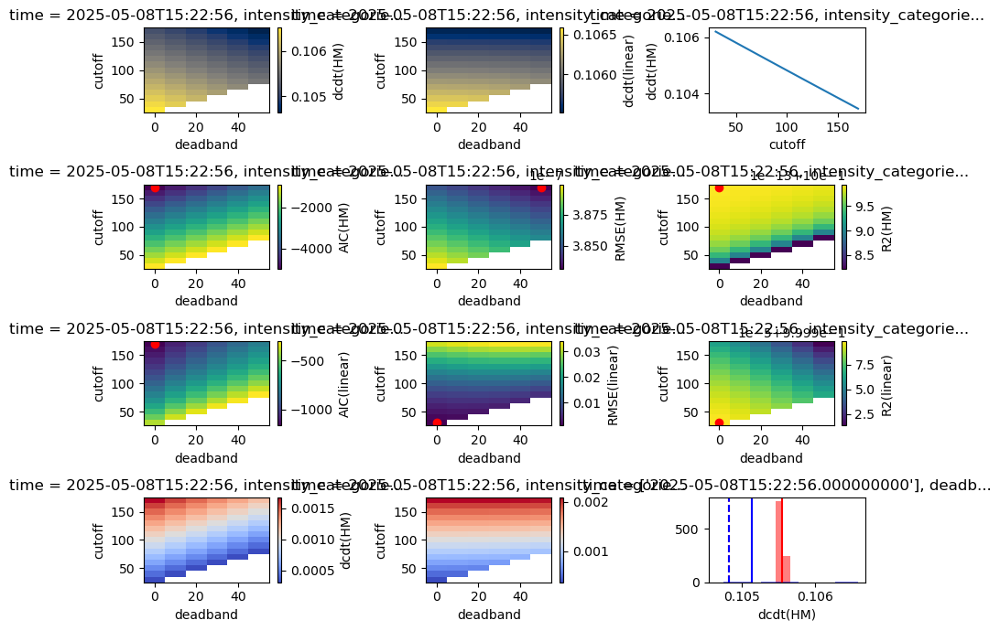

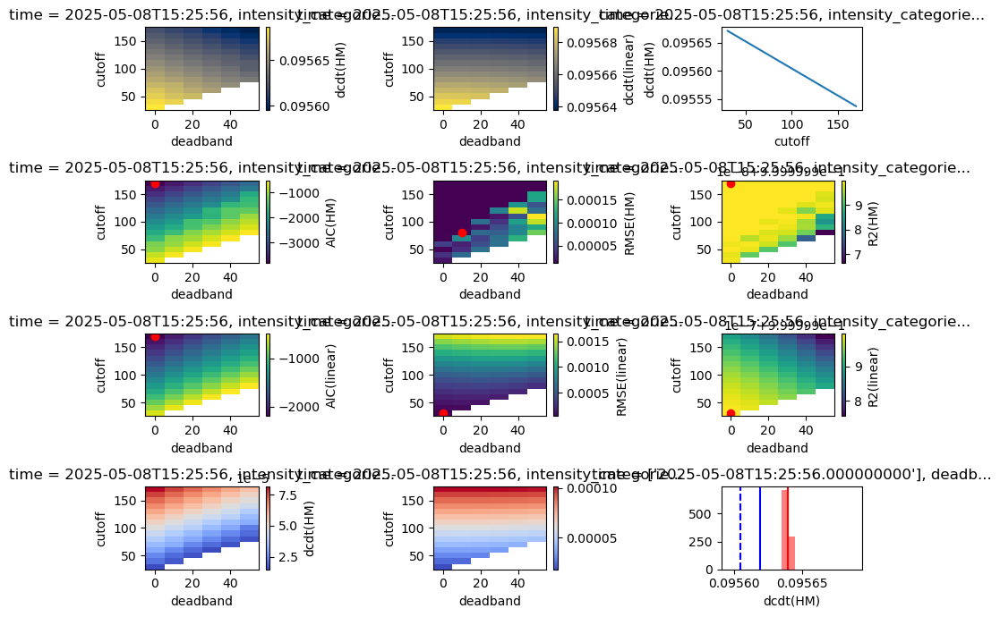

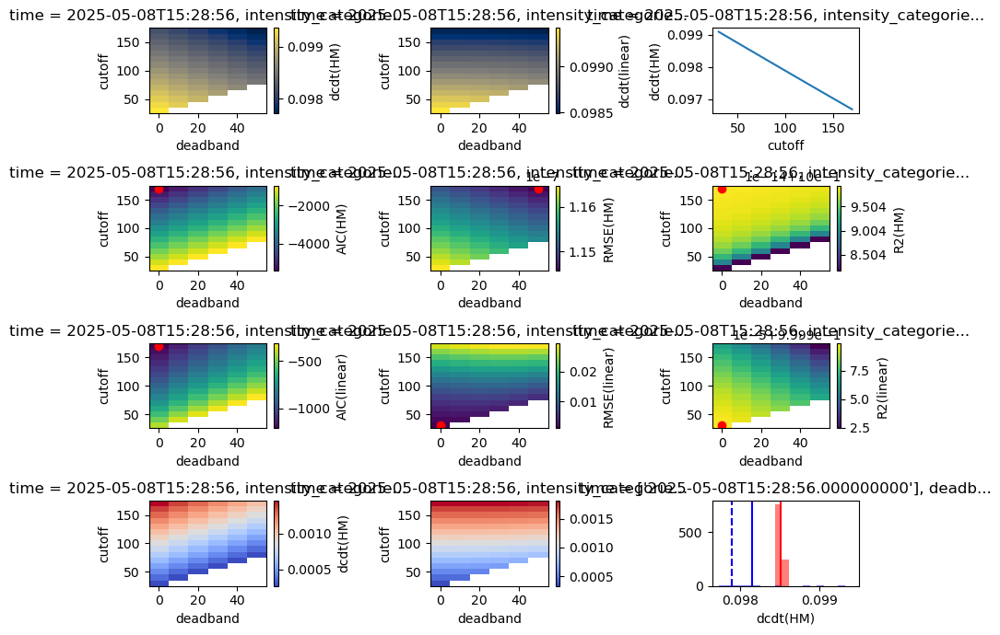

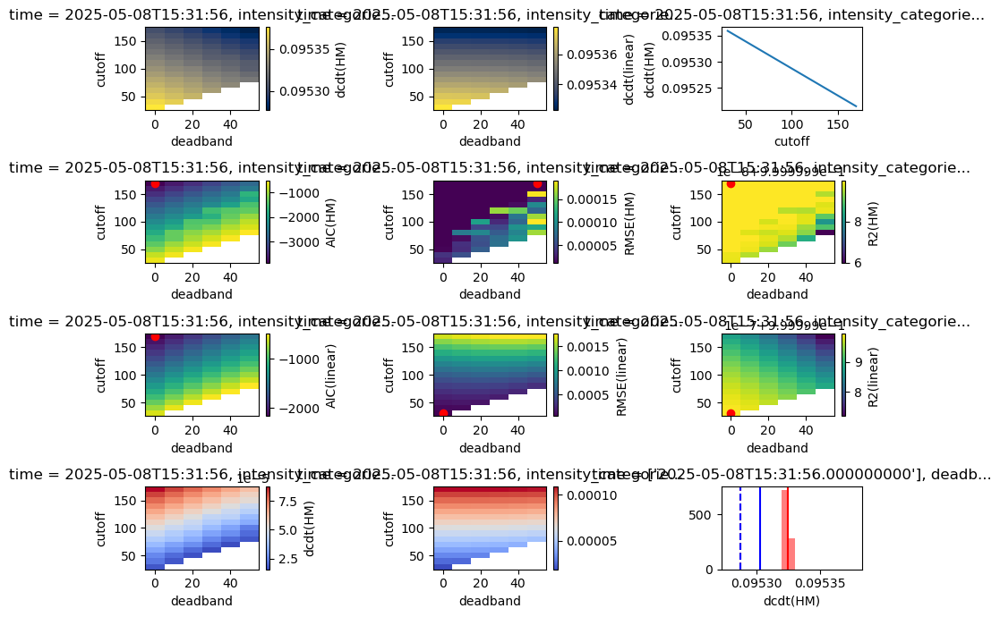

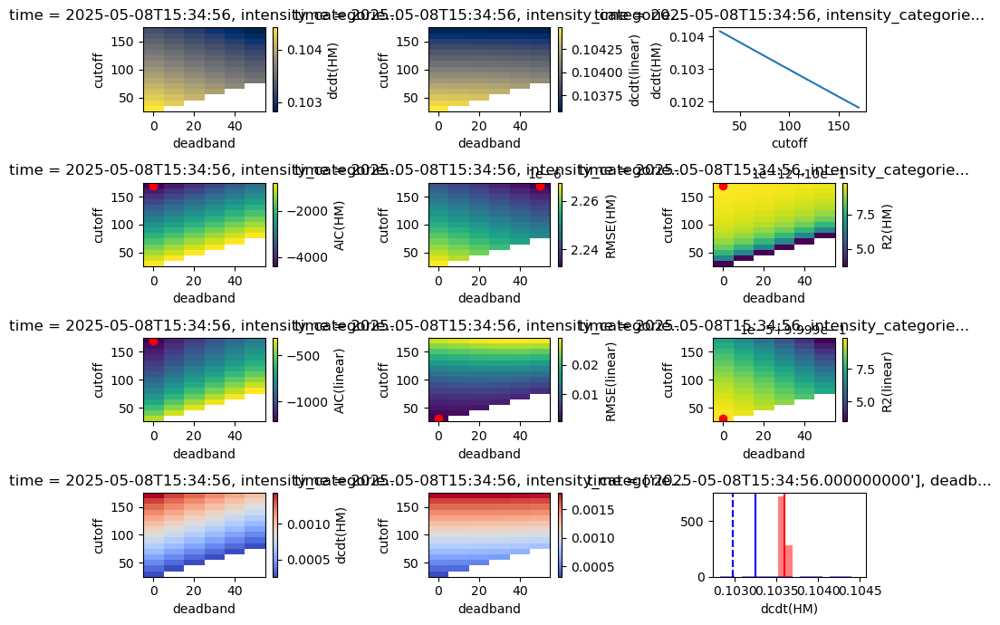

...

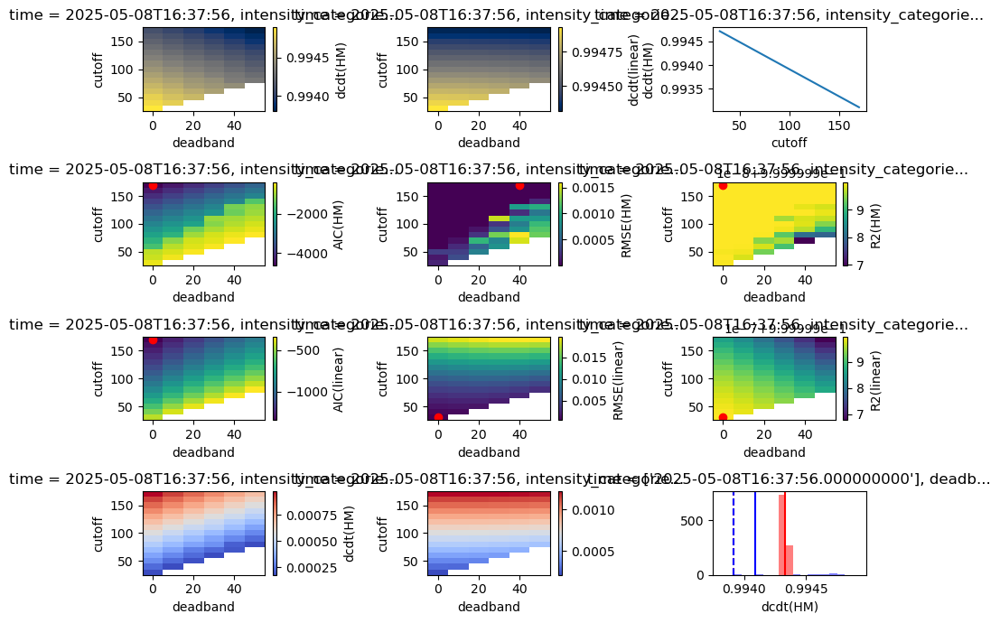

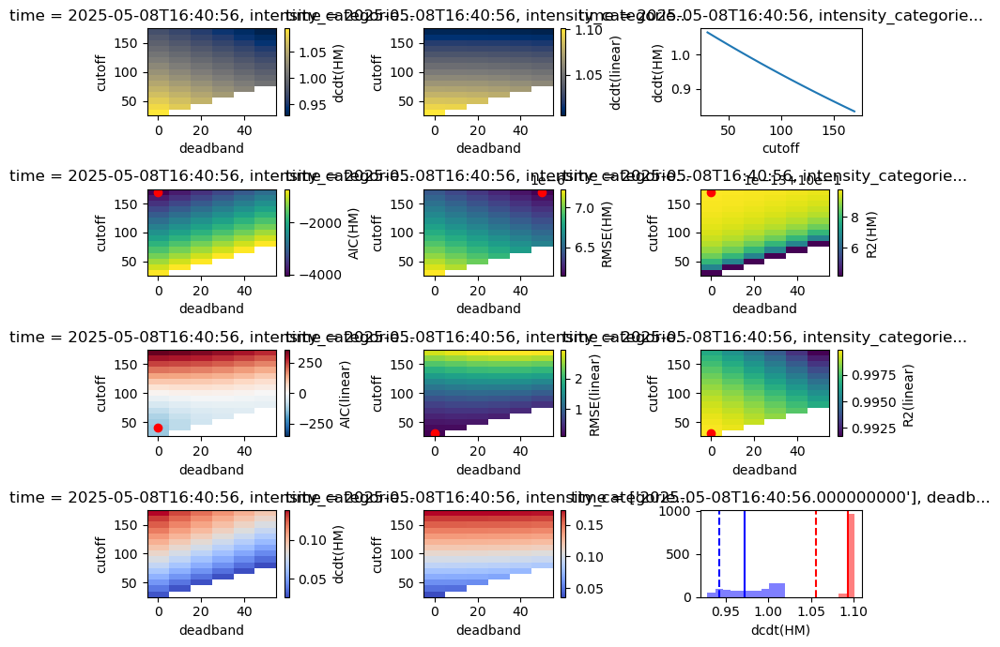

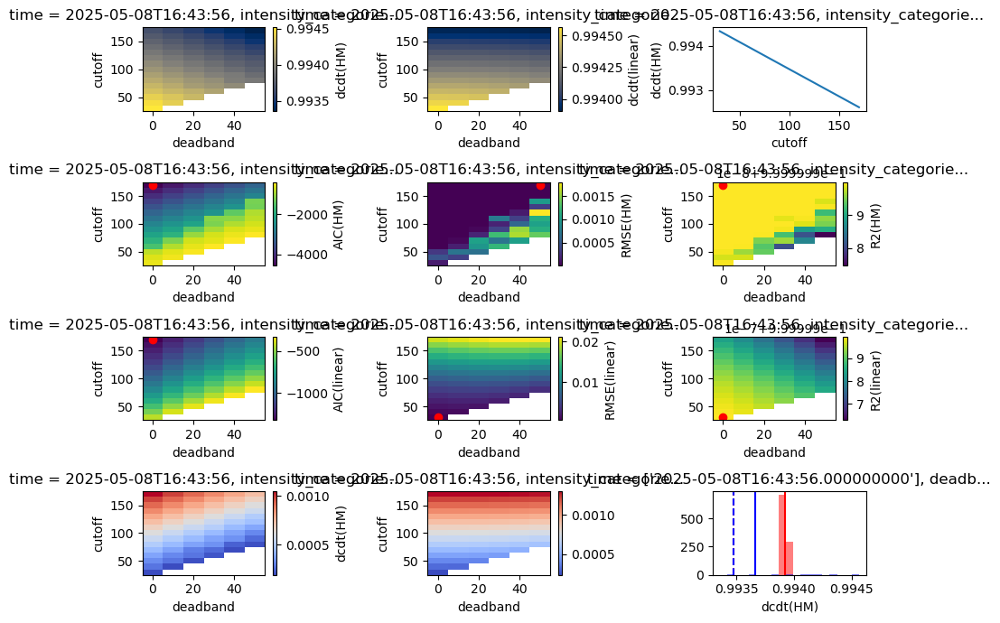

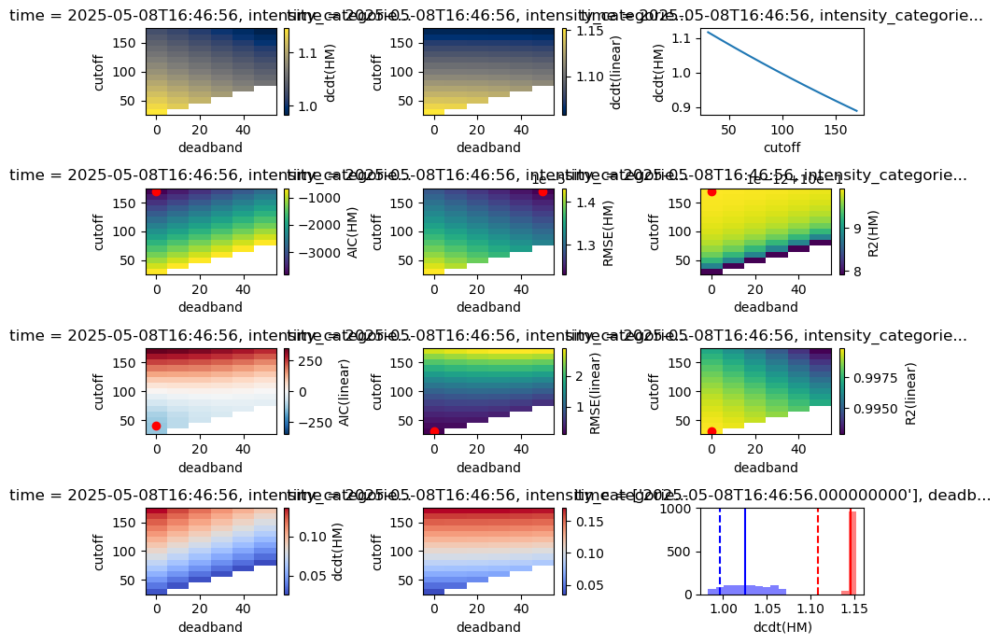

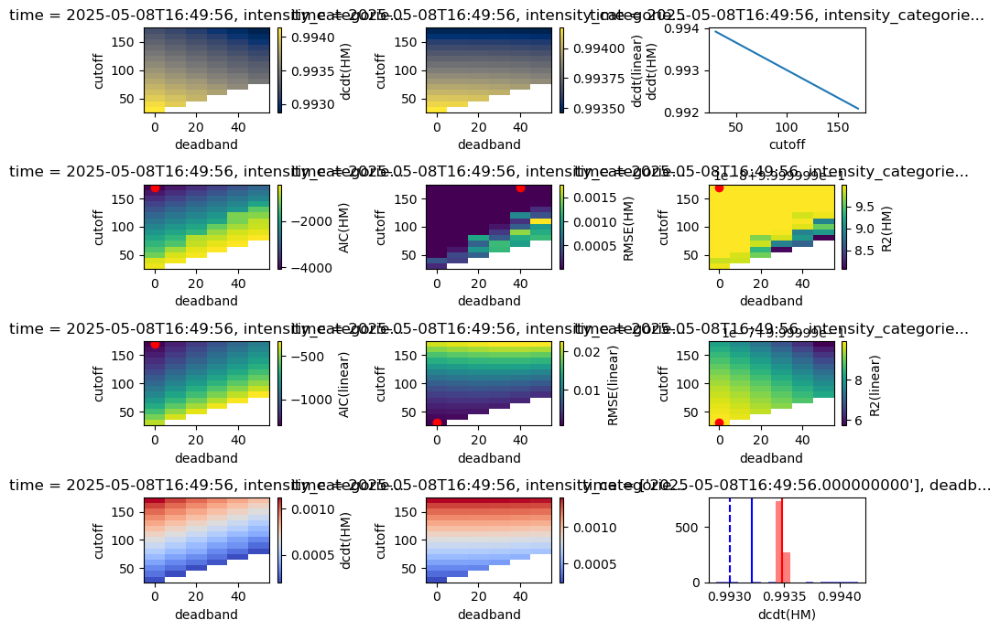

In [158]:
for time in expected_ds['time'].values:
    fig, ax = plt.subplots(4,3, figsize=(9,7))
    time_selection = expected_ds.where((expected_ds['deadband']==0)&(expected_ds['time']==time), drop=True).time
    # print(time_selection)
    cutoff_coords, deadband_coords = ds.coords['cutoff'], ds.coords['deadband']

    ds.sel(time=time_selection)['dcdt(HM)'].plot(ax=ax[0,0], cmap='cividis')
    ds.sel(time=time_selection)['dcdt(linear)'].plot(ax=ax[0,1], cmap='cividis')
    expected_ds.sel(time=time_selection)['dcdt(HM)'].plot(ax=ax[0,2], label='HM')

    ds.sel(time=time_selection)['AIC(HM)'].plot(ax=ax[1,0])
    ds.sel(time=time_selection)['RMSE(HM)'].plot(ax=ax[1,1])
    ds.sel(time=time_selection)['R2(HM)'].plot(ax=ax[1,2])

    ds.sel(time=time_selection)['AIC(linear)'].plot(ax=ax[2,0])
    ds.sel(time=time_selection)['RMSE(linear)'].plot(ax=ax[2,1])
    ds.sel(time=time_selection)['R2(linear)'].plot(ax=ax[2,2])


    aic_argmin_HM = ds.sel(time=time_selection)['AIC(HM)'].argmin(dim=['cutoff', 'deadband'])
    aic_argmin_linear = ds.sel(time=time_selection)['AIC(linear)'].argmin(dim=['cutoff', 'deadband'])

    rmse_argmin_HM = ds.sel(time=time_selection)['RMSE(HM)'].argmin(dim=['cutoff', 'deadband'])
    rmse_argmin_linear = ds.sel(time=time_selection)['RMSE(linear)'].argmin(dim=['cutoff', 'deadband'])

    r2_argmax_HM = ds.sel(time=time_selection)['R2(HM)'].argmax(dim=['cutoff', 'deadband'])
    r2_argmax_linear = ds.sel(time=time_selection)['R2(linear)'].argmax(dim=['cutoff', 'deadband'])

    ax[1,0].scatter(deadband_coords[aic_argmin_HM['deadband']], 
                    cutoff_coords[aic_argmin_HM['cutoff']], color='red')
    ax[2,0].scatter(deadband_coords[aic_argmin_linear['deadband']],
                    cutoff_coords[aic_argmin_linear['cutoff']], color='red')
    
    ax[1,1].scatter(deadband_coords[rmse_argmin_HM['deadband']],
                    cutoff_coords[rmse_argmin_HM['cutoff']], color='red')
    ax[2,1].scatter(deadband_coords[rmse_argmin_linear['deadband']],
                    cutoff_coords[rmse_argmin_linear['cutoff']], color='red')
    
    ax[1,2].scatter(deadband_coords[r2_argmax_HM['deadband']],
                    cutoff_coords[r2_argmax_HM['cutoff']], color='red')
    ax[2,2].scatter(deadband_coords[r2_argmax_linear['deadband']],
                    cutoff_coords[r2_argmax_linear['cutoff']], color='red')
    
    


    (ds.sel(time=time_selection)['dcdt(HM)'] - expected_ds.sel(time=time_selection)['dcdt(HM)']).plot(ax=ax[3,0], cmap='coolwarm')
    (ds.sel(time=time_selection)['dcdt(linear)'] - expected_ds.sel(time=time_selection)['dcdt(HM)']).plot(ax=ax[3,1], cmap='coolwarm')


    dcdt_max = np.maximum(ds.sel(time=time_selection)['dcdt(HM)'].max(), ds.sel(time=time_selection)['dcdt(linear)'].max())
    # print(ds.sel(time=time_selection)['dcdt(HM)'].min(), ds.sel(time_selection)['dcdt(linear)'].min())
    dcdt_min = np.minimum(ds.sel(time=time_selection)['dcdt(HM)'].min(), ds.sel(time=time_selection)['dcdt(linear)'].min())

    # print(dsMC.sel(time=time_selection,
    #          deadband=deadband_coords[aic_argmin_linear['deadband']],
    #          cutoff=cutoff_coords[aic_argmin_linear['cutoff']])['dcdt(HM)'].values)

    dsMC.sel(time=time_selection,
             deadband=deadband_coords[aic_argmin_linear['deadband']],
             cutoff=cutoff_coords[aic_argmin_linear['cutoff']])['dcdt(linear)'].plot.hist(
                 bins=np.linspace(dcdt_min, dcdt_max, 20),
                 ax=ax[3,2], alpha=0.5, color='red')

    dsMC.sel(time=time_selection,
             deadband=deadband_coords[aic_argmin_HM['deadband']],
             cutoff=cutoff_coords[aic_argmin_HM['cutoff']])['dcdt(HM)'].plot.hist(
                 bins=np.linspace(dcdt_min, dcdt_max, 20),
                 ax=ax[3,2], alpha=0.5, color='blue')
    

    ax[3,2].axvline(ds.sel(time=time_selection,
                            deadband=deadband_coords[aic_argmin_linear['deadband']],
                            cutoff=cutoff_coords[aic_argmin_linear['cutoff']])['dcdt(linear)'], color='red')
    ax[3,2].axvline(ds.sel(time=time_selection,
                           deadband=deadband_coords[aic_argmin_HM['deadband']],
                           cutoff=cutoff_coords[aic_argmin_HM['cutoff']])['dcdt(HM)'], color='blue')
    
    ax[3,2].axvline(expected_ds.sel(time=time_selection,
                                    cutoff=slice(0, cutoff_coords[aic_argmin_linear['cutoff']].values[0]))['dcdt(HM)'].median(), color='red', linestyle='--')
    ax[3,2].axvline(expected_ds.sel(time=time_selection,
                                    cutoff=slice(0, cutoff_coords[aic_argmin_HM['cutoff']].values[0]))['dcdt(HM)'].median(), color='blue', linestyle='--')
    
    # ax[3,2].axvline(expected_ds.sel(time=time_selection,
    #                                 cutoff=cutoff_coords[aic_argmin_HM['cutoff']].values[0])['dcdt(HM)'], color='blue', linestyle='--')
    

    fig.tight_layout()
    fig.show()
    # break
    

40

60

90

120

170




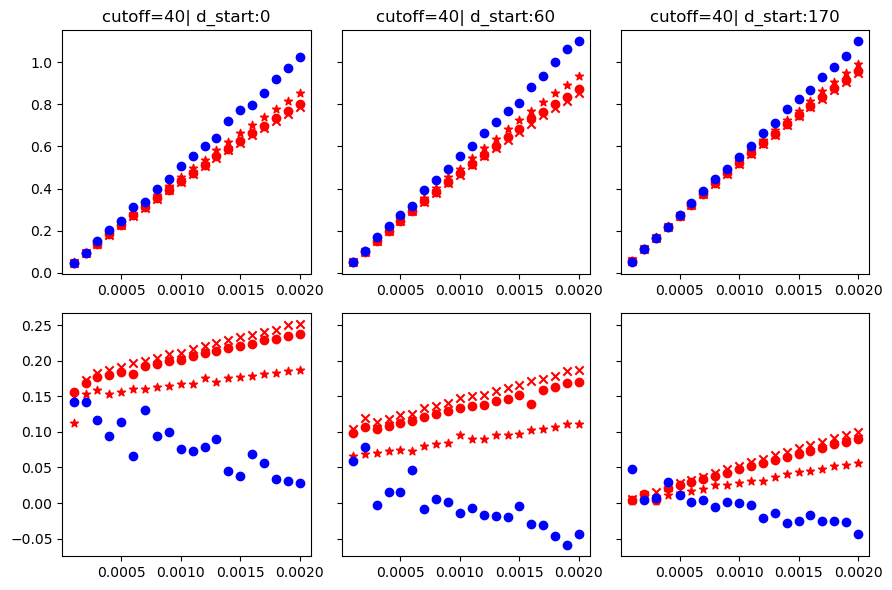

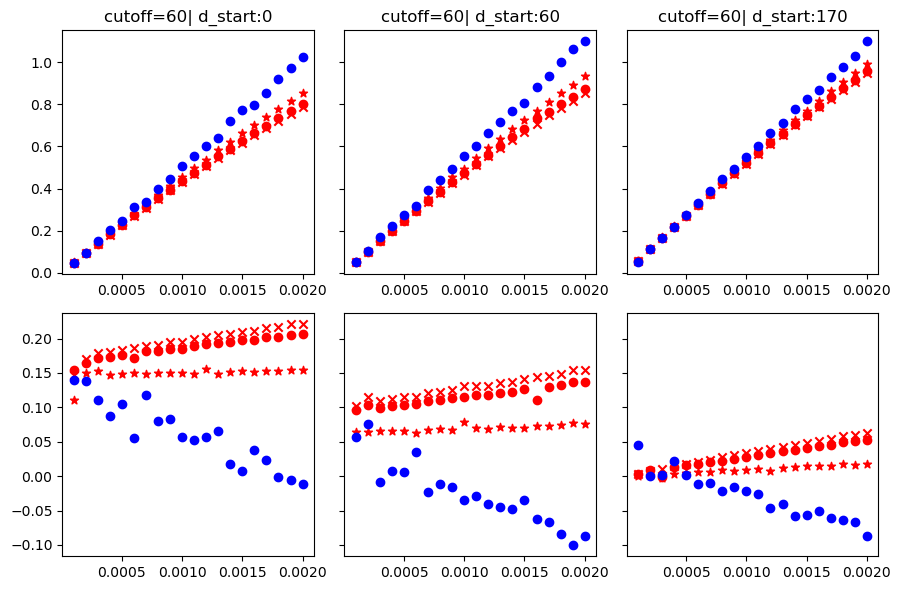

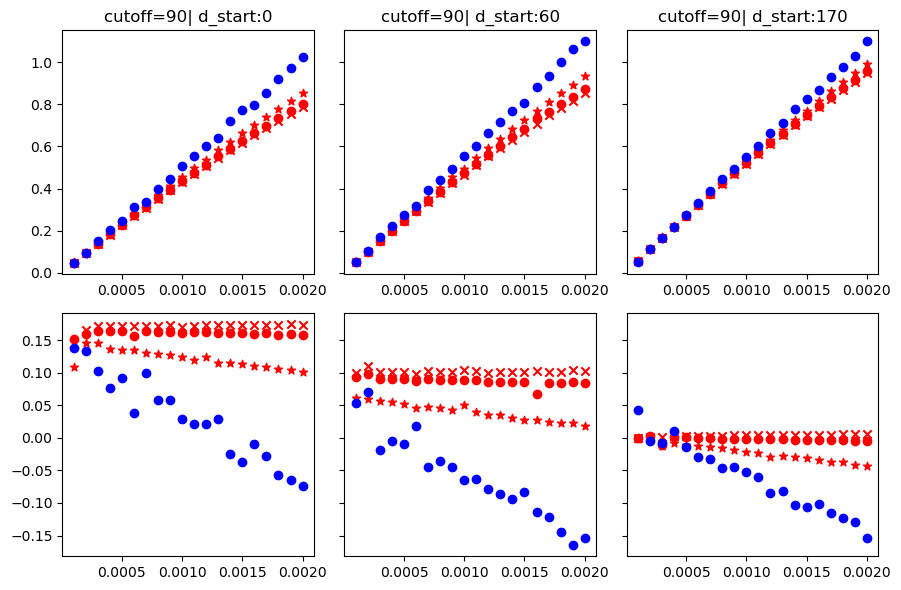

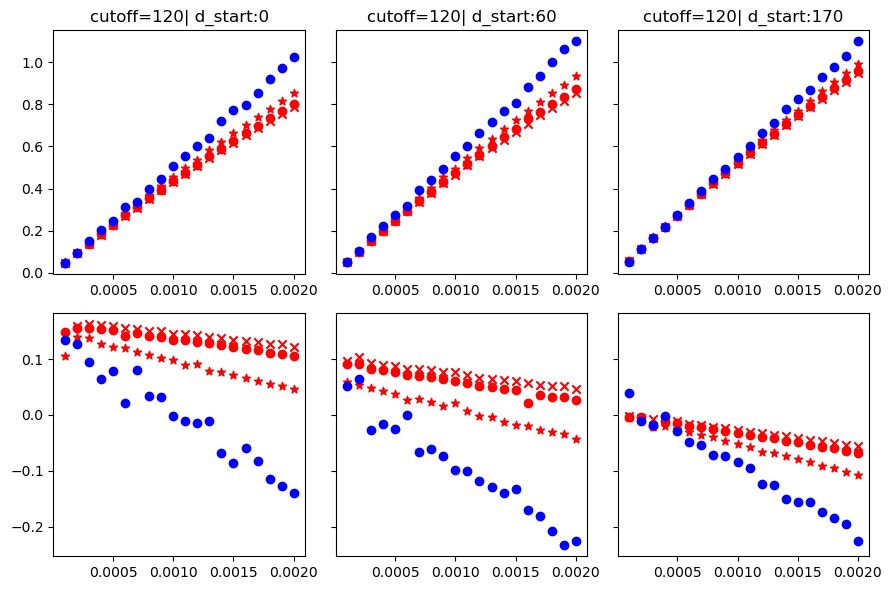

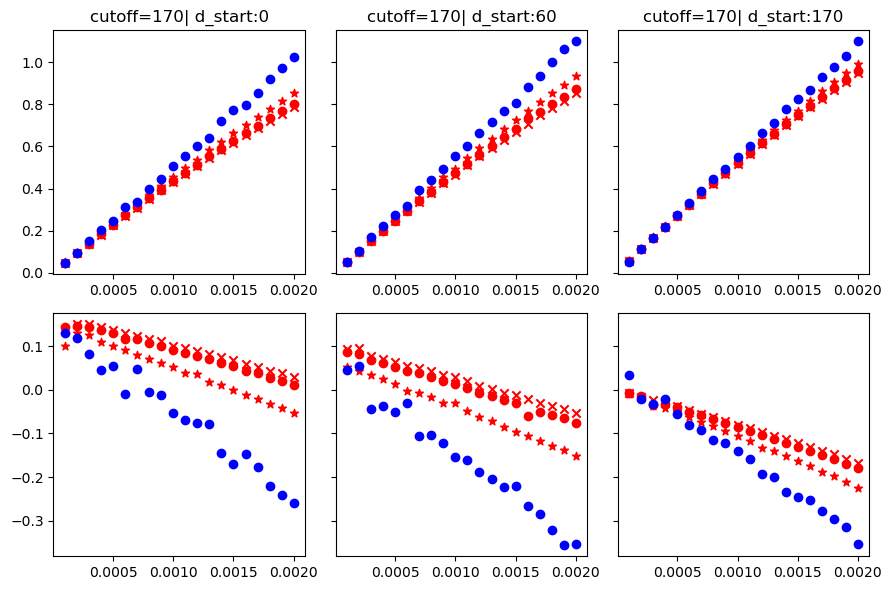

In [144]:
cutoff_times = [40,60, 90,120, 170]
disturbances_start = [0, 60, 170]
for cutoff_time in cutoff_times:
    print(cutoff_time)
    fig, ax = plt.subplots(2, len(disturbances_start), figsize=(3*len(disturbances_start), 6), sharey='row')
    cutoff_coords, deadband_coords = ds.coords['cutoff'], ds.coords['deadband']

    # expected_ds.sel(cutoff=cutoff_time)['dcdt(HM)']
    for n_d_start,d_start in enumerate(disturbances_start):

        for alpha in np.unique(expected_ds['alpha'].values):
            
            mask = (expected_ds['d_startpoint'] == d_start)&(expected_ds['alpha'] == alpha)&(expected_ds['d_intensity']==-10)
            # print(mask.where(mask, drop=True).time)
            time_selection = mask.where(mask, drop=True).time
            
            # print(ds.sel(time=time_selection)['dcdt(HM)'].median(dim=['time']))
            aic_argmin_HM = ds.sel(time=time_selection)['AIC(HM)'].median(dim=['time']).argmin(dim=['cutoff', 'deadband'])
            aic_argmin_linear = ds.sel(time=time_selection)['AIC(linear)'].median(dim=['time']).argmin(dim=['cutoff', 'deadband'])

            rmse_argmin_HM = ds.sel(time=time_selection)['RMSE(HM)'].median(dim=['time']).argmin(dim=['cutoff', 'deadband'])
            rmse_argmin_linear = ds.sel(time=time_selection)['RMSE(linear)'].median(dim=['time']).argmin(dim=['cutoff', 'deadband'])

            dcdt_HM_arb = ds.sel(time=time_selection, deadband=20, cutoff=120)['dcdt(HM)'].median()
            dcdt_HM_arb2 = ds.sel(time=time_selection, deadband=20, cutoff=170)['dcdt(HM)'].median()

            dcdt_HM_bestAIC = (ds.sel(time=time_selection,
                                   deadband=deadband_coords[aic_argmin_HM['deadband']],
                                   cutoff=cutoff_coords[aic_argmin_HM['cutoff']])['dcdt(HM)'].median())
            
            dcdt_linear_bestAIC = (ds.sel(time=time_selection,
                                          deadband=deadband_coords[aic_argmin_linear['deadband']],
                                            cutoff=cutoff_coords[aic_argmin_linear['cutoff']])['dcdt(linear)'].median())
            
            # print(deadband_coords[aic_argmin_linear['deadband']].values, cutoff_coords[aic_argmin_linear['cutoff']].values)
            
            
            dcdt_HM_expected = expected_ds.where(mask).sel(cutoff=cutoff_time)['dcdt(HM)'].median()#.median()
            

            rel_diff_dcdt_HM = (dcdt_HM_expected - dcdt_HM_bestAIC)/dcdt_HM_expected
            rel_diff_dcdt_HM_arb = (dcdt_HM_expected - dcdt_HM_arb)/dcdt_HM_expected
            rel_diff_dcdt_HM_arb2 = (dcdt_HM_expected - dcdt_HM_arb2)/dcdt_HM_expected

            rel_diff_dcdt_linear = (dcdt_HM_expected - dcdt_linear_bestAIC)/dcdt_HM_expected

            

            ax[0,n_d_start].scatter(alpha, dcdt_HM_arb, color='red', marker='*')
            ax[0,n_d_start].scatter(alpha, dcdt_HM_arb2, color='red', marker='x')


            ax[0,n_d_start].scatter(alpha, dcdt_HM_bestAIC, color='red')

            ax[0, n_d_start].scatter(alpha, dcdt_linear_bestAIC, color='blue')

            ax[1,n_d_start].scatter(alpha, rel_diff_dcdt_HM, color='red')
            ax[1,n_d_start].scatter(alpha, rel_diff_dcdt_HM_arb, color='red', marker='*')
            ax[1,n_d_start].scatter(alpha, rel_diff_dcdt_HM_arb2, color='red', marker='x')

            ax[1, n_d_start].scatter(alpha, rel_diff_dcdt_linear, color='blue')
            # break
    # break

    print()

    # print(time_selection)

    ax[0,0].set_title(f'cutoff={cutoff_time}| d_start:{disturbances_start[0]}')
    ax[0,1].set_title(f'cutoff={cutoff_time}| d_start:{disturbances_start[1]}')
    ax[0,2].set_title(f'cutoff={cutoff_time}| d_start:{disturbances_start[2]}')

    fig.tight_layout()
    fig.show()
print()


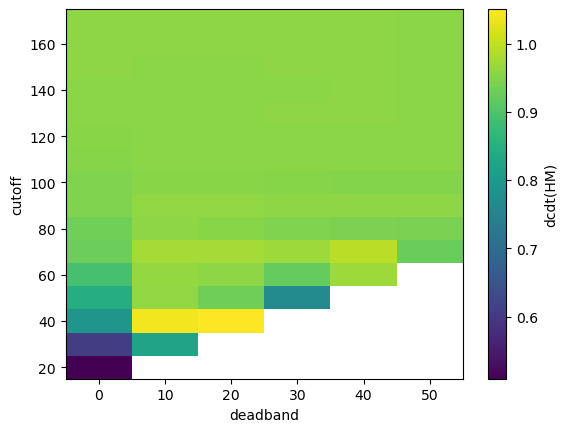

In [111]:
ds.sel(time=time_selection)['dcdt(HM)'].mean(dim=['time']).plot()